# Load Data

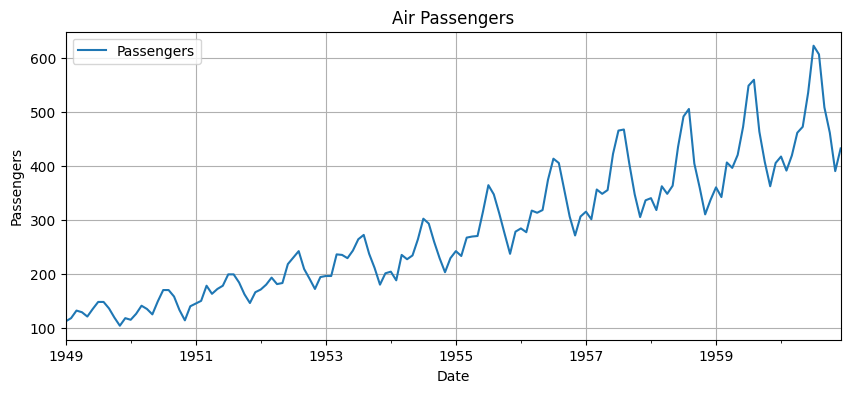

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import warnings

warnings.filterwarnings("ignore")


# Load the AirPassengers dataset
url = "https://raw.githubusercontent.com/jbrownlee/Datasets/master/airline-passengers.csv"
df = pd.read_csv(url, parse_dates=['Month'], index_col='Month')

# Visualize the series
df.plot(figsize=(10, 4), title="Air Passengers")
plt.xlabel("Date")
plt.ylabel("Passengers")
plt.grid()
plt.show()

# Split Data

In [2]:
def create_time_series_features(data, lookback_window=12):
    """
    Create features for time series forecasting using lagged values
    """
    X, y = [], []
    
    for i in range(lookback_window, len(data)):
        # Use previous 'lookback_window' values as features
        X.append(data[i-lookback_window:i])
        y.append(data[i])
    
    return np.array(X), np.array(y)

In [3]:
lag = 12
X = df['Passengers'][:-lag]
y = df['Passengers'][lag:]

# Define sizes
n = len(X)
train_size = int(n * 0.7)
val_size = int(n * 0.15)
test_size = n - train_size - val_size

# Split the series
X_train = X[:train_size]
y_train = y[:train_size]
X_val = X[train_size:train_size + val_size]
y_val = y[train_size:train_size + val_size]
X_test = X[train_size + val_size:]
y_test = y[train_size + val_size:]

# Confirm sizes
print(f"Train starts on: {X_train.index[0]}, Train ends on: {X_train.index[-1]}")
print(f"Validation starts on: {X_val.index[0]}, Validation ends on: {X_val.index[-1]}")
print(f"Test starts on: {X_test.index[0]}, Test ends on: {X_test.index[-1]}")
print(f"Train size: {len(X_train)}, Val size: {len(X_val)}, Test size: {len(X_test)}")

Train starts on: 1949-01-01 00:00:00, Train ends on: 1956-08-01 00:00:00
Validation starts on: 1956-09-01 00:00:00, Validation ends on: 1958-03-01 00:00:00
Test starts on: 1958-04-01 00:00:00, Test ends on: 1959-12-01 00:00:00
Train size: 92, Val size: 19, Test size: 21


In [4]:
from sklearn.preprocessing import StandardScaler

# Scale the features
scaler_X = StandardScaler()
scaler_y = StandardScaler()

X_train_scaled = scaler_X.fit_transform(np.array(X_train).reshape(-1,1))
X_val_scaled = scaler_X.transform(np.array(X_val).reshape(-1,1))
y_train_scaled = scaler_y.fit_transform(np.array(y_train).reshape(-1, 1)).ravel()
y_val_scaled = scaler_y.transform(np.array(y_val).reshape(-1, 1)).ravel()


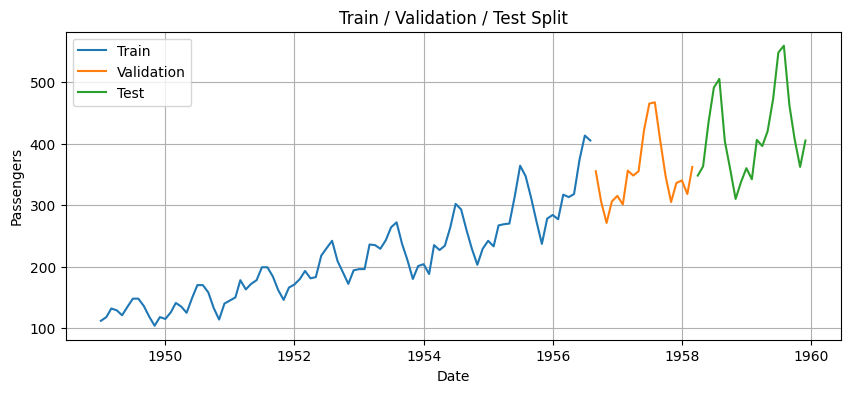

In [5]:
plt.figure(figsize=(10, 4))
plt.plot(X_train, label="Train")
plt.plot(X_val, label="Validation")
plt.plot(X_test, label="Test")
plt.title("Train / Validation / Test Split")
plt.xlabel("Date")
plt.ylabel("Passengers")
plt.legend()
plt.grid()
plt.show()

# Base Models

In [6]:
from abc import ABC, abstractmethod
from statsmodels.tsa.arima.model import ARIMA
from sklearn.svm import SVR
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_squared_error
from copy import deepcopy

class AbstractBaseModel (ABC):

    def __init__(self, model, hparams, *args, **kwagrs):
        self.model = model
        self.hparams = hparams
        self.fitness_score = 0.0
        self.forecast = None

    @abstractmethod
    def train(self, X_train, y_train):
        raise NotImplementedError("Subclasses must implement train method")

    @abstractmethod
    def predict(self, X_test):
        raise NotImplementedError("Subclasses must implement predict method")

    @abstractmethod
    def get_name(self):
        raise NotImplementedError("Subclasses must implement get_name method")
    
    @abstractmethod
    def crossover(self, other):
        raise NotImplementedError("Subclasses must implement crossover method")

    @abstractmethod
    def mutate(self):
        raise NotImplementedError("Subclasses must implement mutate method")
    
    def calculate_fitness(self, pred, y_test, diversity_score):
        alpha = 0.9
        beta = 0.1
        self.fitness_score = (alpha * 1/(np.sqrt(mean_squared_error(y_test, pred)) + 1e-8)) + (beta * diversity_score)
        return self.fitness_score
    
    def __str__(self):
        return str(type(self).__name__) + ' ' + str(self.hparams) + ' Fitness: ' + str(self.fitness_score)
    
    def __repr__(self):
        return str(type(self).__name__) + ' ' + str(self.hparams) + ' Fitness: ' + str(self.fitness_score)


class ArimaModel(AbstractBaseModel):

    def __init__(self, *args, **kwargs):
        super().__init__(*args, **kwargs)
    
    def train(self, X_train, y_train):
        p = self.hparams['p']
        d = self.hparams['d']
        q = self.hparams['q']
        self.model = ARIMA(X_train, order=(p, d, q)).fit()
    
    def predict(self, X_test):
        self.forecast = self.model.forecast(steps=len(X_test))
        return self.forecast
    
    @classmethod
    def get_name(cls):
        return 'arima'
    
    def crossover(self, other):
        if not isinstance(other, ArimaModel):
            raise ValueError("Can only crossover with another ArimaModel")
        
        child1 = deepcopy(self)
        child2 = deepcopy(other)
        
        if np.random.random() < 0.5:
            child1.hparams['p'], child2.hparams['p'] = child2.hparams['p'], child1.hparams['p']
        if np.random.random() < 0.5:
            child1.hparams['d'], child2.hparams['d'] = child2.hparams['d'], child1.hparams['d']
        if np.random.random() < 0.5:
            child1.hparams['q'], child2.hparams['q'] = child2.hparams['q'], child1.hparams['q']
        
        child1.fitness_score = 0.0
        child2.fitness_score = 0.0
        
        return child1, child2
    
    def mutate(self):
        # Randomly select which parameter to mutate
        mutation_param = np.random.choice(['p', 'd', 'q'])
        
        if mutation_param == 'p':
            self.hparams['p'] = np.random.randint(0, 5)
        elif mutation_param == 'd':
            self.hparams['d'] = np.random.randint(0, 2)
        elif mutation_param == 'q':
            self.hparams['q'] = np.random.randint(0, 5)
        
        self.fitness_score = 0.0
        
        return self

class SVRModel (AbstractBaseModel):

    def __init__(self, *args, **kwargs):
        super().__init__(*args, **kwargs)

    def train(self, X_train, y_train):
        kernel = self.hparams['kernel']
        c = self.hparams['c']
        gamma = self.hparams['gamma']
        epsilon = self.hparams['epsilon']
        self.model = SVR(kernel=kernel, C=c, gamma=gamma, epsilon=epsilon)
        self.model.fit(X_train, y_train)
    
    def predict(self, X_test):
        self.forecast = self.model.predict(X_test)
        return self.forecast
    
    @classmethod
    def get_name(cls):
        return 'svr'
    
    def crossover(self, other):
        if not isinstance(other, SVRModel):
            raise ValueError("Can only crossover with another SVRModel")
        
        child1 = deepcopy(self)
        child2 = deepcopy(other)
        
        if np.random.random() < 0.5:
            child1.hparams['kernel'], child2.hparams['kernel'] = child2.hparams['kernel'], child1.hparams['kernel']
        
        if np.random.random() < 0.5:
            alpha = np.random.random()
            c1, c2 = child1.hparams['c'], child2.hparams['c']
            child1.hparams['c'] = alpha * c1 + (1 - alpha) * c2
            child2.hparams['c'] = alpha * c2 + (1 - alpha) * c1
        
        if np.random.random() < 0.5:
            alpha = np.random.random()
            eps1, eps2 = child1.hparams['epsilon'], child2.hparams['epsilon']
            child1.hparams['epsilon'] = alpha * eps1 + (1 - alpha) * eps2
            child2.hparams['epsilon'] = alpha * eps2 + (1 - alpha) * eps1
        
        child1.fitness_score = 0.0
        child2.fitness_score = 0.0
        
        return child1, child2
    
    def mutate(self):
        
        # Randomly select which parameter to mutate
        mutation_param = np.random.choice(['kernel', 'c', 'epsilon'])
        
        if mutation_param == 'kernel':
            self.hparams['kernel'] = np.random.choice(["linear", "rbf", "poly"])
        
        elif mutation_param == 'c':
            current_c = self.hparams['c']
            noise = np.random.normal(0, current_c * 0.1)  # 10% noise
            self.hparams['c'] = max(0.1, min(100, current_c + noise))
        
        elif mutation_param == 'epsilon':
            current_eps = self.hparams['epsilon']
            noise = np.random.normal(0, current_eps * 0.1)  # 10% noise
            self.hparams['epsilon'] = max(0.001, min(0.5, current_eps + noise))

        self.fitness_score = 0.0
        
        return self
    
class MLPModel (AbstractBaseModel):

    def __init__(self, *args, **kwargs):
        super().__init__(*args, **kwargs)

    def train(self, X_train, y_train):
        hidden_layer_sizes = self.hparams['hidden_layer_sizes']
        learning_rate = self.hparams['learning_rate']
        
        hidden_layer_sizes = (int(hidden_layer_sizes),)
        
        self.model = MLPRegressor(hidden_layer_sizes=hidden_layer_sizes,
                            learning_rate_init=learning_rate,
                            max_iter=500, random_state=42)
        self.model.fit(X_train, y_train)
    
    def predict(self, X_test):
        self.forecast = self.model.predict(X_test)
        return self.forecast
    
    @classmethod
    def get_name(cls):
        return 'mlp'
    
    def crossover(self, other):
        if not isinstance(other, MLPModel):
            raise ValueError("Can only crossover with another MLPModel")
        
        child1 = deepcopy(self)
        child2 = deepcopy(other)
        
        if np.random.random() < 0.5:
            alpha = np.random.random()
            h1, h2 = child1.hparams['hidden_layer_sizes'], child2.hparams['hidden_layer_sizes']
            child1.hparams['hidden_layer_sizes'] = int(alpha * h1 + (1 - alpha) * h2)
            child2.hparams['hidden_layer_sizes'] = int(alpha * h2 + (1 - alpha) * h1)
        
        if np.random.random() < 0.5:
            alpha = np.random.random()
            lr1, lr2 = child1.hparams['learning_rate'], child2.hparams['learning_rate']
            child1.hparams['learning_rate'] = alpha * lr1 + (1 - alpha) * lr2
            child2.hparams['learning_rate'] = alpha * lr2 + (1 - alpha) * lr1
        
        child1.fitness_score = 0.0
        child2.fitness_score = 0.0
        
        return child1, child2
    
    def mutate(self):
        
        # Randomly select which parameter to mutate
        mutation_param = np.random.choice(['hidden_layer_sizes', 'learning_rate'])
        
        if mutation_param == 'hidden_layer_sizes':
            current_size = self.hparams['hidden_layer_sizes']
            change = np.random.randint(-10, 11)  # Change by -10 to +10
            self.hparams['hidden_layer_sizes'] = max(5, min(50, current_size + change))
        
        elif mutation_param == 'learning_rate':
            current_lr = self.hparams['learning_rate']
            noise = np.random.normal(0, current_lr * 0.1)  # 10% noise
            self.hparams['learning_rate'] = max(0.001, min(0.1, current_lr + noise))

        self.fitness_score = 0.0
        
        return self

    
class EnsembleModel (AbstractBaseModel):

    def __init__(self, *args, **kwargs):
        super().__init__(*args, **kwargs)

    def train(self, X_train, y_train):
        for model in self.hparams.keys():
            self.hparams[model].train(X_train, y_train)
    
    def predict(self, X_test):
        self.forecast = 0.0
        for model in self.hparams.keys():
            self.forecast += self.hparams[model].predict(X_test)
        self.forecast /= len(self.hparams.keys()) # Average of all predictions
        return self.forecast
    
    @classmethod
    def get_name(cls):
        return 'ensemble'
    
    def crossover(self, other):
        return self, other
    
    def mutate(self):
        return self


# Model Diversity and Evaluation

In [7]:
def print_population(population):
    for model in population.keys():
        for individual in population[model]:
            print(individual)
    print('============================\n\n')


def init_population(population_size, pool_of_models):
    population = {}

    for model in pool_of_models:
        population[model.get_name()] = []
        if model is ArimaModel:
            for _ in range(population_size):
                population[model.get_name()].append(
                    ArimaModel(
                        ARIMA,
                        {
                            'p': np.random.randint(0, 5),
                            'd': np.random.randint(0, 2),
                            'q': np.random.randint(0, 5)
                        }
                    )
                )
        elif model is SVRModel:
            for _ in range(population_size):
                population[model.get_name()].append(
                    SVRModel(
                        SVR,
                        {
                            'kernel' : np.random.choice(["linear", "rbf", "poly"]),
                            'c' : np.random.uniform(0.1, 100),
                            'gamma': np.random.choice(['scale']),
                            'epsilon' : np.random.uniform(0.001, 0.5)
                        }
                    )
                )
        elif model is MLPModel:
            for _ in range(population_size):
                population[model.get_name()].append(
                    MLPModel(
                        MLPRegressor,
                        {
                            'hidden_layer_sizes': np.random.randint(5, 50),
                            'learning_rate': np.random.uniform(0.001, 0.1)
                        }
                    )
                )
    
    return population

In [8]:
from itertools import zip_longest


def individual_diversity(population, X_test):
    
    # Get predictions from all models
    model_predictions = {}
    model_names = []
    
    # print("Generating predictions from individual models...")
    for model in population.keys():
        model_names.append(model)
        model_predictions[model] = []
        for individual in population[model]:
            model_predictions[model].append(individual.predict(X_test))
    
    # Convert to numpy array for easier computation
    pred_matrix = [list(lst) for lst in zip_longest(*model_predictions.values(), fillvalue=None)]
    
    # Calculate pairwise disagreements using MSE
    n_rows, n_cols = np.shape(pred_matrix)[0:2]
    disagreement_matrix = np.zeros((n_rows, n_cols))

    for i in range(n_rows):  # For each model instance (row)
        for j in range(n_cols):  # For each model type (column)
            ref_pred = pred_matrix[i][j]
            mse_list = []
            for k in range(n_cols):
                if k != j:
                    comp_pred = pred_matrix[i][k]
                    mse = mean_squared_error(ref_pred, comp_pred)
                    mse_list.append(mse)
            disagreement_matrix[i][j] = np.mean(mse_list)
    
    return disagreement_matrix

In [9]:
def individual_evaluation_with_diversity(population, X_train, y_train, X_val, y_val):

    for model in population.keys():
        for individual in population[model]:
            individual.train(X_train, y_train)
            pred = individual.predict(X_val)
            # individual.calculate_fitness(pred, y_val)

    disagreement_matrix = individual_diversity(population, X_val)

    i = 0
    for model in population.keys():
        j = 0
        for individual in population[model]:
            pred = individual.predict(X_val)
            individual.calculate_fitness(pred, y_val, disagreement_matrix[j][i])
            j +=1
        i += 1


In [10]:
def individual_evaluation(population, X_train, y_train, X_val, y_val):

    for model in population.keys():
        for individual in population[model]:
            individual.train(X_train, y_train)
            pred = individual.predict(X_val)
            individual.calculate_fitness(pred, y_val)


In [11]:
from itertools import combinations


def calculate_model_diversity(models_dict, X_test):
    """
    Calculate disagreement measure (diversity) for ensemble models using MSE.
    
    Parameters:
    -----------
    models_dict : dict
        Dictionary with model names as keys and trained model objects as values
        Format: {'model_name': model_object, ...}
    X_test : array-like
        Test data for generating predictions
    
    Returns:
    --------
    float : Average disagreement measure across all model pairs
    dict : Dictionary with detailed diversity metrics and model predictions
    """
    
    if len(models_dict) < 2:
        raise ValueError("Need at least 2 models to calculate diversity")
    
    # Get predictions from all models
    model_predictions = {}
    model_names = []
    
    # print("Generating predictions from individual models...")
    for model_name, model_obj in models_dict.items():
        predictions = model_obj.predict(X_test)
        model_predictions[model_name] = predictions
        model_names.append(model_name)
        # print(f"  {model_name}: predictions generated")
    
    # Convert to numpy array for easier computation
    pred_matrix = np.column_stack([model_predictions[name] for name in model_names])
    n_models = len(model_names)
    
    # Calculate pairwise disagreements using MSE
    pairwise_disagreements = []
    disagreement_matrix = np.zeros((n_models, n_models))
    model_pairs = []
    
    # print("\nCalculating pairwise disagreements...")
    for i, j in combinations(range(n_models), 2):
        model_i = model_names[i]
        model_j = model_names[j]
        pred_i = pred_matrix[:, i]
        pred_j = pred_matrix[:, j]
        
        disagreement = mean_squared_error(pred_i, pred_j)
        pairwise_disagreements.append(disagreement)
        disagreement_matrix[i, j] = disagreement
        disagreement_matrix[j, i] = disagreement  # Symmetric matrix
        model_pairs.append((model_i, model_j))
        
        # print(f"  {model_i} vs {model_j}: MSE = {disagreement:.6f}")
    
    # Calculate overall diversity measure
    avg_disagreement = np.mean(pairwise_disagreements)
    
    # Additional diversity statistics
    diversity_stats = {
        'average_disagreement': avg_disagreement,
        'pairwise_disagreements': pairwise_disagreements,
        'disagreement_matrix': disagreement_matrix,
        'model_pairs': model_pairs,
        'min_disagreement': np.min(pairwise_disagreements),
        'max_disagreement': np.max(pairwise_disagreements),
        'std_disagreement': np.std(pairwise_disagreements),
        'n_pairs': len(pairwise_disagreements),
        'model_names': model_names,
        'individual_predictions': model_predictions
    }
    
    return avg_disagreement, diversity_stats

In [12]:
def plot_forecasts(models, actual):
    plt.figure(figsize=(10, 4))
    plt.plot(actual, label='Actual')
    for model in models:
        plt.plot(model.forecast, label= model.get_name())
    # plt.xlabel("Date")
    # plt.ylabel("Passengers")
    plt.grid()
    plt.legend()
    plt.show()


In [13]:
def team_evaluation(population, X_test, y_test):
    alpha = 0.8
    beta = 0.2

    best_models = {}
    # Select the best individual of each subpopulation
    for model in population.keys():
        best_ind = None
        for individual in population[model]:
            best_ind = individual if best_ind is None or individual.fitness_score > best_ind.fitness_score else best_ind
        
        best_models[best_ind.get_name()] = best_ind
    
    ensemble = EnsembleModel(None, best_models)
    pred = ensemble.predict(X_test)

    models = best_models.copy()
    models['ensemble'] = ensemble
    plot_forecasts(models.values(), y_test)

    diversity_score, _ = calculate_model_diversity(best_models, X_test)
    fitness_score = (alpha * (1/(np.sqrt(mean_squared_error(pred, y_test) + 1e-8)))) + (beta * diversity_score)

    return fitness_score, best_models, pred, ensemble


# Genetic Algorithm Operators

In [14]:
from copy import deepcopy


def tournament_selection(population, tournament_size=3):
    selected_population = {}
    
    for model_type in population.keys():
        model_list = population[model_type]
        population_size = len(model_list)
        selected_population[model_type] = []
        
        # Perform tournament selection to maintain population size
        for _ in range(population_size):
            # Randomly select tournament_size individuals
            tournament_indices = np.random.choice(population_size, 
                                                size=min(tournament_size, population_size), 
                                                replace=False)
            
            # Find the individual with highest fitness in the tournament
            best_individual = None
            best_fitness = -1
            
            for idx in tournament_indices:
                individual = model_list[idx]
                if individual.fitness_score > best_fitness:
                    best_fitness = individual.fitness_score
                    best_individual = individual
            
            # Add a deep copy to avoid reference issues
            selected_population[model_type].append(deepcopy(best_individual))
    
    return selected_population

In [15]:
def crossover(population, crossover_rate=0.8):
    new_population = {}
    
    for model_type in population.keys():
        model_list = population[model_type]
        population_size = len(model_list)
        new_population[model_type] = []
        
        # Process pairs of individuals
        for i in range(0, population_size - 1, 2):
            parent1 = model_list[i]
            parent2 = model_list[i + 1]
            
            # Decide whether to perform crossover
            if np.random.random() < crossover_rate:
                # Use the crossover method of the object
                child1, child2 = parent1.crossover(parent2)
                new_population[model_type].extend([child1, child2])
            else:
                # No crossover, just copy parents
                new_population[model_type].extend([deepcopy(parent1), deepcopy(parent2)])
        
        # Handle odd population size
        if population_size % 2 == 1:
            new_population[model_type].append(deepcopy(model_list[-1]))
    
    return new_population

In [16]:
def mutation(population, mutation_rate=0.2):
    mutated_population = {}
    
    for model_type in population.keys():
        model_list = population[model_type]
        mutated_population[model_type] = []
        
        for individual in model_list:
            # Decide whether to mutate this individual
            if np.random.random() < mutation_rate:
                # Use the mutate method of the object
                mutated_individual = individual.mutate()
                mutated_population[model_type].append(mutated_individual)
            else:
                # No mutation, just copy the individual
                mutated_population[model_type].append(deepcopy(individual))
    
    return mutated_population

# Cooperative CoEvolutional Algorithm

Initializing population...
Population created: 
ArimaModel {'p': 1, 'd': 0, 'q': 2} Fitness: 0.0
ArimaModel {'p': 1, 'd': 1, 'q': 0} Fitness: 0.0
ArimaModel {'p': 1, 'd': 1, 'q': 2} Fitness: 0.0
ArimaModel {'p': 1, 'd': 1, 'q': 2} Fitness: 0.0
ArimaModel {'p': 2, 'd': 0, 'q': 4} Fitness: 0.0
ArimaModel {'p': 3, 'd': 1, 'q': 0} Fitness: 0.0
ArimaModel {'p': 2, 'd': 0, 'q': 3} Fitness: 0.0
ArimaModel {'p': 3, 'd': 0, 'q': 1} Fitness: 0.0
ArimaModel {'p': 3, 'd': 0, 'q': 0} Fitness: 0.0
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 0.0
SVRModel {'kernel': 'rbf', 'c': 17.371693442723934, 'gamma': 'scale', 'epsilon': 0.256984858705127} Fitness: 0.0
SVRModel {'kernel': 'poly', 'c': 53.85072097719303, 'gamma': 'scale', 'epsilon': 0.24584603632886795} Fitness: 0.0
SVRModel {'kernel': 'rbf', 'c': 76.1396063237519, 'gamma': 'scale', 'epsilon': 0.01005150113313177} Fitness: 0.0
SVRModel {'kernel': 'rbf', 'c': 5.357408135785648, 'gamma': 'scale', 'epsilon': 0.1879971527099805} Fitness: 0.0
SVRModel

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


ArimaModel {'p': 1, 'd': 0, 'q': 2} Fitness: 1.043271547805118
ArimaModel {'p': 1, 'd': 1, 'q': 0} Fitness: 1.5356537489229773
ArimaModel {'p': 1, 'd': 1, 'q': 2} Fitness: 1.0939797964301208
ArimaModel {'p': 1, 'd': 1, 'q': 2} Fitness: 1.082460580370812
ArimaModel {'p': 2, 'd': 0, 'q': 4} Fitness: 2.2162450264524134
ArimaModel {'p': 3, 'd': 1, 'q': 0} Fitness: 1.5601904734532193
ArimaModel {'p': 2, 'd': 0, 'q': 3} Fitness: 1.7486243658145209
ArimaModel {'p': 3, 'd': 0, 'q': 1} Fitness: 1.7022692192249729
ArimaModel {'p': 3, 'd': 0, 'q': 0} Fitness: 1.0857582195768403
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.0786387609167778
SVRModel {'kernel': 'rbf', 'c': 17.371693442723934, 'gamma': 'scale', 'epsilon': 0.256984858705127} Fitness: 1.4644136651273465
SVRModel {'kernel': 'poly', 'c': 53.85072097719303, 'gamma': 'scale', 'epsilon': 0.24584603632886795} Fitness: 1.6658198751898803
SVRModel {'kernel': 'rbf', 'c': 76.1396063237519, 'gamma': 'scale', 'epsilon': 0.01005150113313177} Fitn

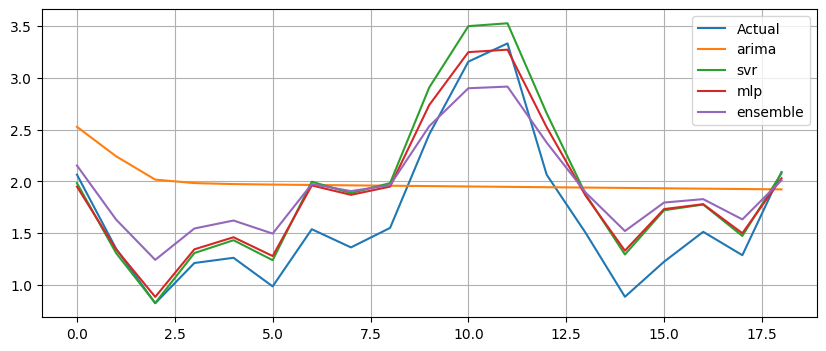

Generation 1: Fitness = 2.12763




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


ArimaModel {'p': 3, 'd': 0, 'q': 1} Fitness: 2.05687054393659
ArimaModel {'p': 3, 'd': 0, 'q': 1} Fitness: 1.961473589668224
ArimaModel {'p': 2, 'd': 0, 'q': 4} Fitness: 1.223655126179931
ArimaModel {'p': 2, 'd': 0, 'q': 3} Fitness: 1.1660332941065625
ArimaModel {'p': 3, 'd': 0, 'q': 0} Fitness: 1.0879797827311792
ArimaModel {'p': 1, 'd': 1, 'q': 0} Fitness: 1.5292116960777822
ArimaModel {'p': 2, 'd': 0, 'q': 4} Fitness: 1.227794181376042
ArimaModel {'p': 2, 'd': 0, 'q': 3} Fitness: 2.1425842402888806
ArimaModel {'p': 2, 'd': 0, 'q': 4} Fitness: 1.217264664111773
ArimaModel {'p': 3, 'd': 0, 'q': 1} Fitness: 1.9316410495357144
SVRModel {'kernel': 'poly', 'c': 3.1548513340983417, 'gamma': 'scale', 'epsilon': 0.10882961457266899} Fitness: 1.9597096979272461
SVRModel {'kernel': 'poly', 'c': 53.85072097719303, 'gamma': 'scale', 'epsilon': 0.21599177886012272} Fitness: 1.8162528332413674
SVRModel {'kernel': 'linear', 'c': 74.93430314854925, 'gamma': 'scale', 'epsilon': 0.0374333440917406} Fi

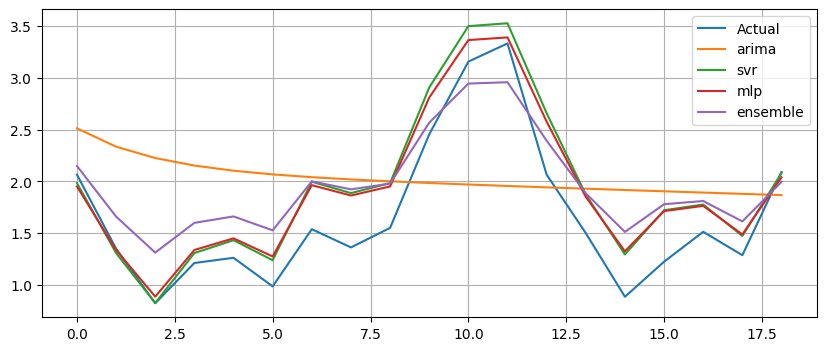

Generation 2: Fitness = 2.08796


ArimaModel {'p': 1, 'd': 1, 'q': 3} Fitness: 1.082143237597417
ArimaModel {'p': 2, 'd': 0, 'q': 0} Fitness: 2.1193180914409653
ArimaModel {'p': 3, 'd': 1, 'q': 0} Fitness: 1.6798445581271984
ArimaModel {'p': 1, 'd': 0, 'q': 1} Fitness: 1.089990160529344
ArimaModel {'p': 3, 'd': 0, 'q': 1} Fitness: 2.0566882752103437
ArimaModel {'p': 2, 'd': 0, 'q': 3} Fitness: 1.1816436575519806
ArimaModel {'p': 2, 'd': 0, 'q': 3} Fitness: 1.1776318556354795
ArimaModel {'p': 2, 'd': 0, 'q': 3} Fitness: 1.174378229738514
ArimaModel {'p': 3, 'd': 0, 'q': 1} Fitness: 1.0921922660534134
ArimaModel {'p': 3, 'd': 0, 'q': 0} Fitness: 1.0904768343864455
SVRModel {'kernel': 'linear', 'c': 53.85072097719303, 'gamma': 'scale', 'epsilon': 0.24584603632886795} Fitness: 2.611130493233459
SVRModel {'kernel': 'poly', 'c': 74.93430314854925, 'gamma': 'scale', 'epsilon': 0.0374333440917406} Fitness: 2.092065348486337
SVRModel {'kernel': 'poly', 'c': 3.1548513340983417, 'gamma': 'scale',

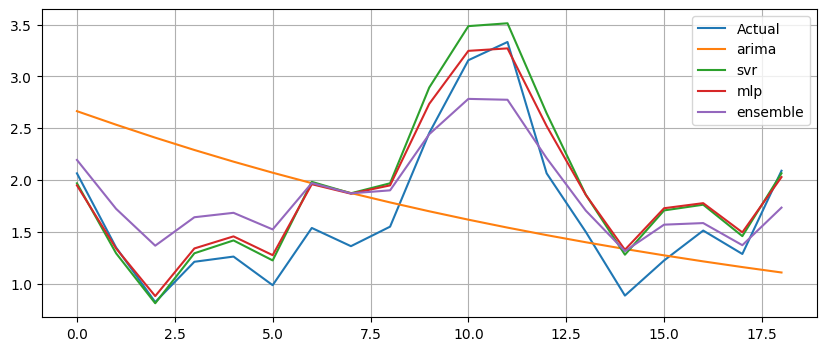

Generation 3: Fitness = 2.27240




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6775974072955198
ArimaModel {'p': 2, 'd': 0, 'q': 1} Fitness: 1.07011607040531
ArimaModel {'p': 3, 'd': 0, 'q': 1} Fitness: 1.092051901783126
ArimaModel {'p': 2, 'd': 0, 'q': 0} Fitness: 1.0798692721324343
ArimaModel {'p': 2, 'd': 0, 'q': 1} Fitness: 1.071851972825997
ArimaModel {'p': 3, 'd': 0, 'q': 0} Fitness: 1.090445968997334
ArimaModel {'p': 2, 'd': 0, 'q': 0} Fitness: 1.080312095464736
ArimaModel {'p': 2, 'd': 0, 'q': 0} Fitness: 1.0793004152746966
ArimaModel {'p': 3, 'd': 0, 'q': 3} Fitness: 1.1667316330582442
ArimaModel {'p': 2, 'd': 0, 'q': 1} Fitness: 1.071890641263733
SVRModel {'kernel': 'linear', 'c': 54.14822378141336, 'gamma': 'scale', 'epsilon': 0.2502016365195036} Fitness: 2.6372407120756907
SVRModel {'kernel': 'linear', 'c': 53.85072097719303, 'gamma': 'scale', 'epsilon': 0.2342268709707552} Fitness: 2.5362512953038814
SVRModel {'kernel': 'linear', 'c': 53.85072097719303, 'gamma': 'scale', 'epsilon': 0.24584603632886795} F

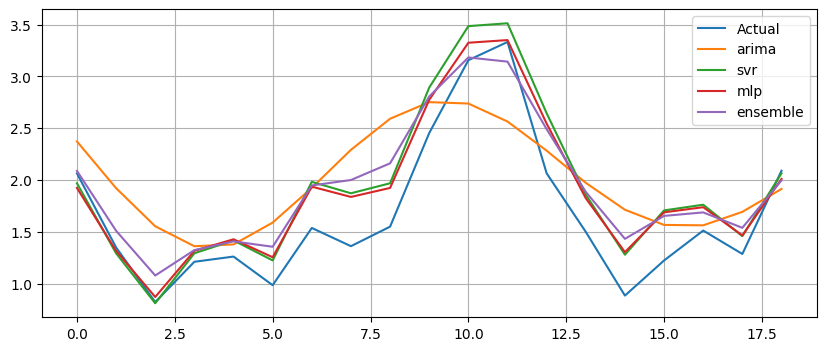

Generation 4: Fitness = 2.32811




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 0, 'q': 3} Fitness: 1.168991998216319
ArimaModel {'p': 3, 'd': 0, 'q': 0} Fitness: 1.0903857795375016
ArimaModel {'p': 3, 'd': 0, 'q': 3} Fitness: 1.1687265973956649
ArimaModel {'p': 2, 'd': 0, 'q': 0} Fitness: 1.083026871767601
ArimaModel {'p': 3, 'd': 0, 'q': 3} Fitness: 1.167348825229847
ArimaModel {'p': 3, 'd': 0, 'q': 0} Fitness: 1.0991453466854701
ArimaModel {'p': 3, 'd': 0, 'q': 3} Fitness: 1.168974106108262
ArimaModel {'p': 4, 'd': 0, 'q': 0} Fitness: 1.0820043691662424
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6785644555842947
ArimaModel {'p': 3, 'd': 0, 'q': 1} Fitness: 1.0915967869608225
SVRModel {'kernel': 'linear', 'c': 67.09846354390858, 'gamma': 'scale', 'epsilon': 0.26987755787275103} Fitness: 2.7915466807566403
SVRModel {'kernel': 'linear', 'c': 67.32647768863757, 'gamma': 'scale', 'epsilon': 0.27057736861698506} Fitness: 2.802300158147365
SVRModel {'kernel': 'linear', 'c': 54.14822378141336, 'gamma': 'scale', 'epsilon': 0.2502016365195036

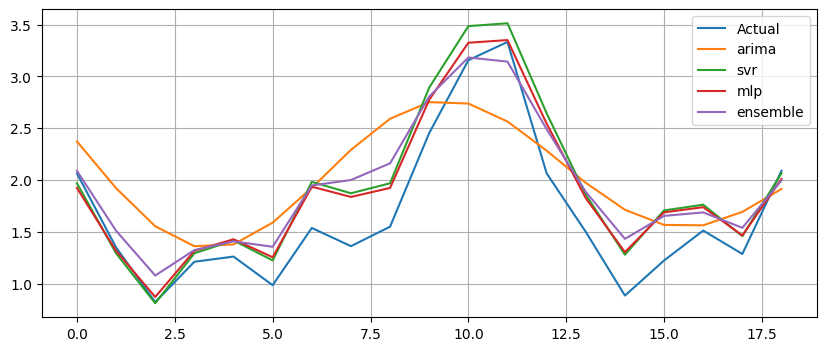

Generation 5: Fitness = 2.32811




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6786051356468124
ArimaModel {'p': 3, 'd': 0, 'q': 3} Fitness: 1.1689847059440224
ArimaModel {'p': 4, 'd': 0, 'q': 0} Fitness: 1.0886916496765255
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6786109979180082
ArimaModel {'p': 3, 'd': 0, 'q': 3} Fitness: 1.1689847059440224
ArimaModel {'p': 3, 'd': 1, 'q': 3} Fitness: 1.6354915523005484
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.678600843766693
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6786076273592534
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.678996159692004
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6786124735745966
SVRModel {'kernel': 'linear', 'c': 67.32647768863757, 'gamma': 'scale', 'epsilon': 0.27057736861698506} Fitness: 2.774420663065689
SVRModel {'kernel': 'linear', 'c': 72.57278083620835, 'gamma': 'scale', 'epsilon': 0.2707190677680022} Fitness: 2.797167590813217
SVRModel {'kernel': 'linear', 'c': 67.32647768863757, 'gamma': 'scale', 'epsilon': 0.2705773686169850

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


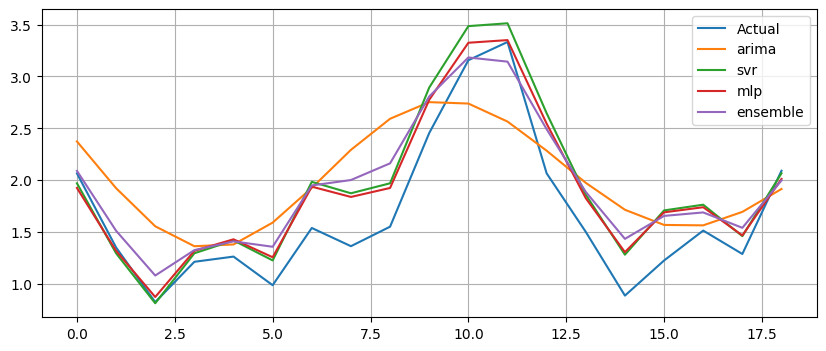

Generation 6: Fitness = 2.32787




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6786117366720068
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6786891254577496
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6786124735745966
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6786124735745966
ArimaModel {'p': 1, 'd': 0, 'q': 3} Fitness: 1.070681321622153
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6786124735745966
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6786134023403345
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6786134023403345
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6786134023403345
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6786134023403345
SVRModel {'kernel': 'linear', 'c': 72.57278083620835, 'gamma': 'scale', 'epsilon': 0.2707190677680022} Fitness: 2.775376890828038
SVRModel {'kernel': 'linear', 'c': 72.57278083620835, 'gamma': 'scale', 'epsilon': 0.2707190677680022} Fitness: 2.7752769916355464
SVRModel {'kernel': 'linear', 'c': 67.32647768863757, 'gamma': 'scale', 'epsilon': 0.270577368616985

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


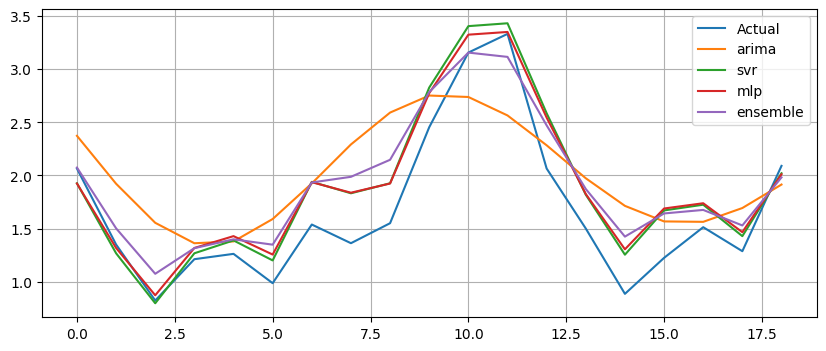

Generation 7: Fitness = 2.39009




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6806351421432029
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6785866544008685
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2470149351497162
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6783603342577058
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6786134023403345
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6772554333075205
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6786134023403345
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6785960372572095
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6783603342577058
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6813961102540649
SVRModel {'kernel': 'linear', 'c': 72.57278083620835, 'gamma': 'scale', 'epsilon': 0.3000887668428849} Fitness: 3.1101819481108683
SVRModel {'kernel': 'linear', 'c': 72.57278083620835, 'gamma': 'scale', 'epsilon': 0.2707190677680022} Fitness: 2.7752696561122208
SVRModel {'kernel': 'linear', 'c': 72.57278083620835, 'gamma': 'scale', 'epsilon': 0.2707190677680

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


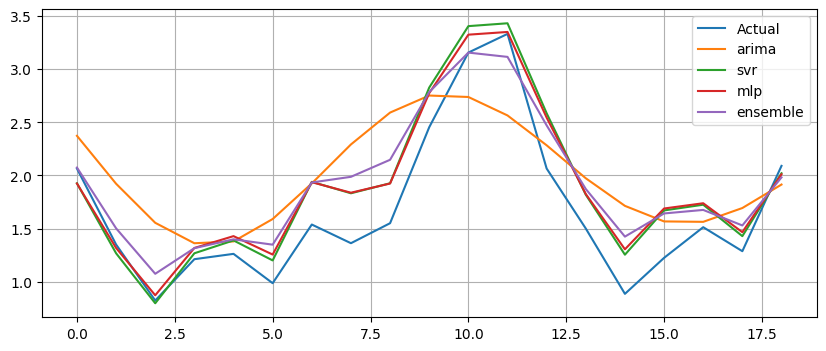

Generation 8: Fitness = 2.39009




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6786049495500335
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6783603342577058
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2459361644909648
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6786134023403345
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6783603342577058
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6783603342577058
ArimaModel {'p': 4, 'd': 0, 'q': 0} Fitness: 1.0886826611878164
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6786134023403345
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6783603342577058
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6783603342577058
SVRModel {'kernel': 'linear', 'c': 72.57278083620835, 'gamma': 'scale', 'epsilon': 0.2707190677680022} Fitness: 2.7753613464151052
SVRModel {'kernel': 'linear', 'c': 72.57278083620835, 'gamma': 'scale', 'epsilon': 0.3000887668428849} Fitness: 3.1082459345182287
SVRModel {'kernel': 'linear', 'c': 72.57278083620835, 'gamma': 'scale', 'epsilon': 0.3000887668428

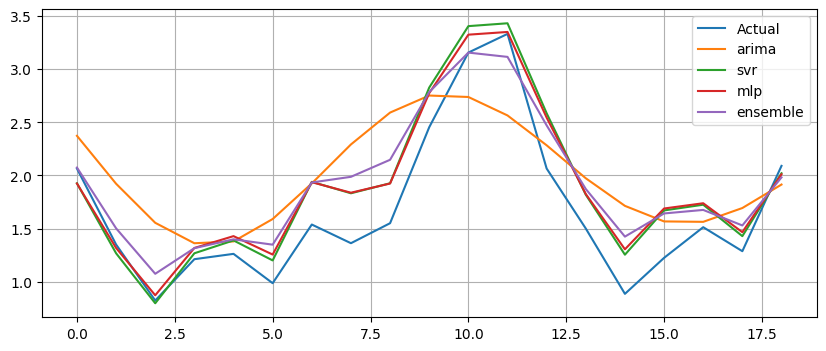

Generation 9: Fitness = 2.39009




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6783603342577058
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6783603342577058
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6783603342577058
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6783603342577058
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6783603342577058
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.0827598853242089
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6783603342577058
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.681337814089144
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6783603342577058
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1473425983873486
SVRModel {'kernel': 'linear', 'c': 72.57278083620835, 'gamma': 'scale', 'epsilon': 0.3000887668428849} Fitness: 3.1082459345182287
SVRModel {'kernel': 'linear', 'c': 72.57278083620835, 'gamma': 'scale', 'epsilon': 0.3000887668428849} Fitness: 3.1082459345182287
SVRModel {'kernel': 'linear', 'c': 72.57278083620835, 'gamma': 'scale', 'epsilon': 0.30008876684288

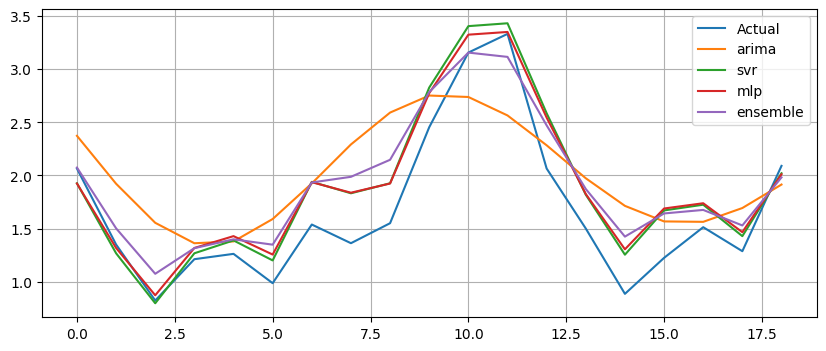

Generation 10: Fitness = 2.39009




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6783603342577058
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2408041395677254
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6783235106008858
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6783603342577058
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.680857827645078
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6783603342577058
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6783603342577058
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.680619556397196
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6783603342577058
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6783603342577058
SVRModel {'kernel': 'linear', 'c': 72.57278083620835, 'gamma': 'scale', 'epsilon': 0.3000887668428849} Fitness: 3.1082459345182287
SVRModel {'kernel': 'linear', 'c': 72.57278083620835, 'gamma': 'scale', 'epsilon': 0.3271188829350774} Fitness: 3.391384768326504
SVRModel {'kernel': 'linear', 'c': 72.57278083620835, 'gamma': 'scale', 'epsilon': 0.3000887668428849

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


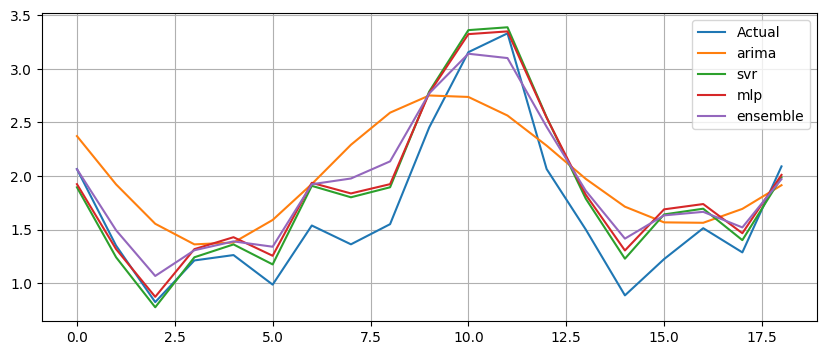

Generation 11: Fitness = 2.44154




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6785803165980833
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6783603342577058
ArimaModel {'p': 4, 'd': 0, 'q': 0} Fitness: 1.0878744070353215
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6992232787836987
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.67855219447453
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1473425983873486
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.678356431116834
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6784089374622277
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6783603342577058
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6760026701847501
SVRModel {'kernel': 'linear', 'c': 72.57278083620835, 'gamma': 'scale', 'epsilon': 0.3271188829350774} Fitness: 3.373571625529129
SVRModel {'kernel': 'linear', 'c': 72.57278083620835, 'gamma': 'scale', 'epsilon': 0.3000887668428849} Fitness: 3.1082459345182287
SVRModel {'kernel': 'linear', 'c': 53.114422129819275, 'gamma': 'scale', 'epsilon': 0.3000887668428849

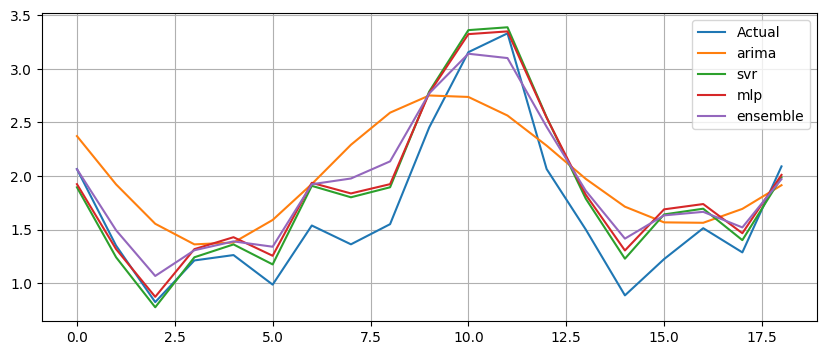

Generation 12: Fitness = 2.44154




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.67855219447453
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6783331901847574
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.67855219447453
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6785686334366352
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6784520011584885
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6787282731377553
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6761501560234753
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.67855219447453
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.67855219447453
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.678573857548324
SVRModel {'kernel': 'linear', 'c': 72.57278083620835, 'gamma': 'scale', 'epsilon': 0.3271188829350774} Fitness: 3.373369576915916
SVRModel {'kernel': 'linear', 'c': 72.57278083620835, 'gamma': 'scale', 'epsilon': 0.31026081029378755} Fitness: 3.2313626943346696
SVRModel {'kernel': 'linear', 'c': 72.57278083620835, 'gamma': 'scale', 'epsilon': 0.3271188829350774} Fitn

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


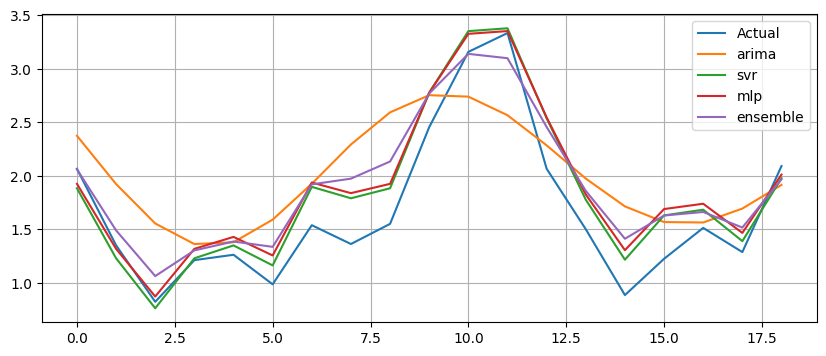

Generation 13: Fitness = 2.46358




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6789194660614095
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1479141766725776
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6787282731377553
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.67855219447453
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791027266310676
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.678605811790306
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.678670046946253
ArimaModel {'p': 0, 'd': 0, 'q': 3} Fitness: 0.9849858157390319
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 2.245639728933326
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6808902939824961
SVRModel {'kernel': 'linear', 'c': 72.57278083620835, 'gamma': 'scale', 'epsilon': 0.3906669329102158} Fitness: 3.4418506695168043
SVRModel {'kernel': 'linear', 'c': 72.57278083620835, 'gamma': 'scale', 'epsilon': 0.3271188829350774} Fitness: 3.391570220116036
SVRModel {'kernel': 'linear', 'c': 72.57278083620835, 'gamma': 'scale', 'epsilon': 0.3393097332920123} F

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


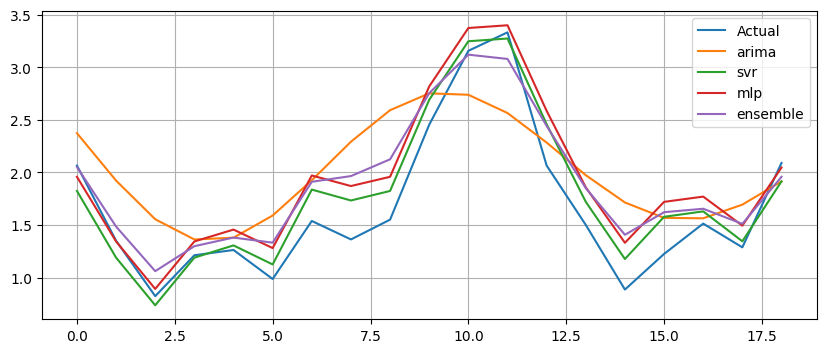

Generation 14: Fitness = 2.50204




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6786428025817781
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6787282731377553
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6786071802794351
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6785821840045771
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6786425462392438
ArimaModel {'p': 4, 'd': 0, 'q': 1} Fitness: 1.0924805698696782
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6789230371760424
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6787028076407096
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791027266310676
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1477866421721048
SVRModel {'kernel': 'linear', 'c': 74.92254179676608, 'gamma': 'scale', 'epsilon': 0.335390553324754} Fitness: 3.445243396187445
SVRModel {'kernel': 'linear', 'c': 72.57278083620835, 'gamma': 'scale', 'epsilon': 0.3393097332920123} Fitness: 3.4794368030817187
SVRModel {'kernel': 'linear', 'c': 72.57278083620835, 'gamma': 'scale', 'epsilon': 0.331038062902335

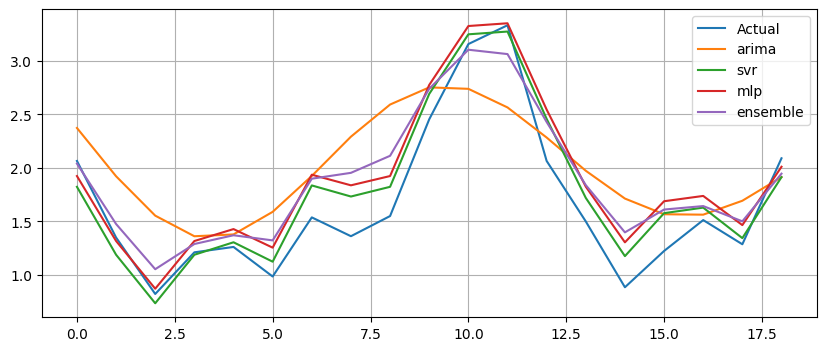

Generation 15: Fitness = 2.55612




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6787592376678802
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6784373020272563
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.678678555021261
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.678699748142954
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6820802064625058
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6781452525785256
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791027266310676
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791027266310676
ArimaModel {'p': 1, 'd': 0, 'q': 3} Fitness: 1.0713851359559732
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6787083727517207
SVRModel {'kernel': 'linear', 'c': 72.57278083620835, 'gamma': 'scale', 'epsilon': 0.3393097332920123} Fitness: 3.479705854767005
SVRModel {'kernel': 'linear', 'c': 72.57278083620835, 'gamma': 'scale', 'epsilon': 0.3185482976530971} Fitness: 3.3004423233451403
SVRModel {'kernel': 'linear', 'c': 74.92254179676608, 'gamma': 'scale', 'epsilon': 0.3359697240633210

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


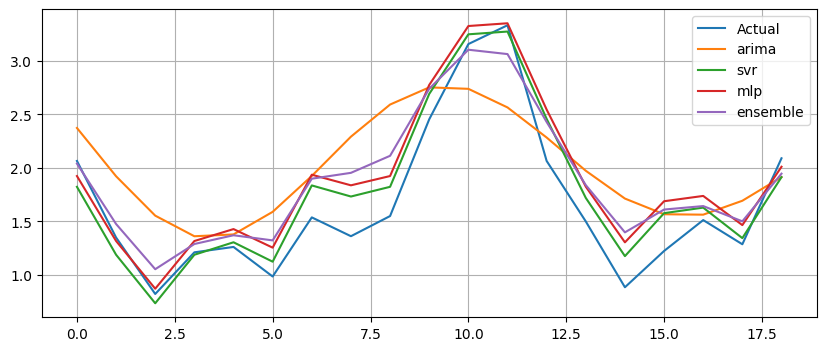

Generation 16: Fitness = 2.55612




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6787282732602917
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791027266310676
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791598382105597
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791027266310676
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791027266310676
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791027266310676
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791050445811109
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6790314558367514
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6790794914210174
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791598382105597
SVRModel {'kernel': 'linear', 'c': 72.77112307321133, 'gamma': 'scale', 'epsilon': 0.3393097332920123} Fitness: 3.4794368417003736
SVRModel {'kernel': 'linear', 'c': 64.18676263452502, 'gamma': 'scale', 'epsilon': 0.42535854862953104} Fitness: 4.0542154341399
SVRModel {'kernel': 'linear', 'c': 64.42380044496002, 'gamma': 'scale', 'epsilon': 0.425358548629531

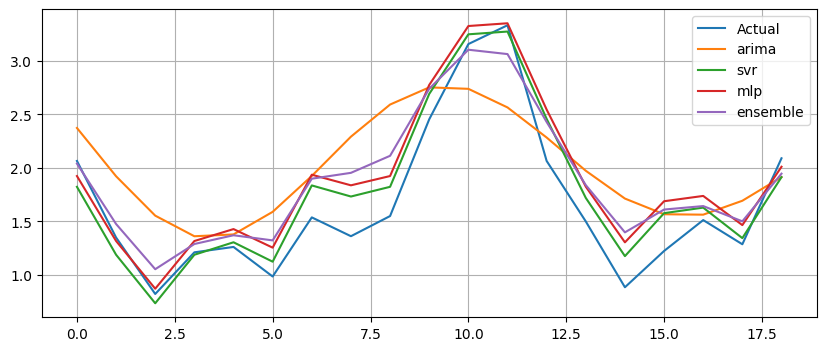

Generation 17: Fitness = 2.55612




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791027266310676
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791027266310676
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791027266310676
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.679083534905807
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791589890886824
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6787321648697446
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791027266310676
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791027266310676
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791027266310676
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.240812060978761
SVRModel {'kernel': 'linear', 'c': 72.57278083620835, 'gamma': 'scale', 'epsilon': 0.42535854862953104} Fitness: 4.0542154341399
SVRModel {'kernel': 'linear', 'c': 64.18676263452502, 'gamma': 'scale', 'epsilon': 0.42535854862953104} Fitness: 4.0542154341399
SVRModel {'kernel': 'linear', 'c': 79.63131895826902, 'gamma': 'scale', 'epsilon': 0.42535854862953104} 

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


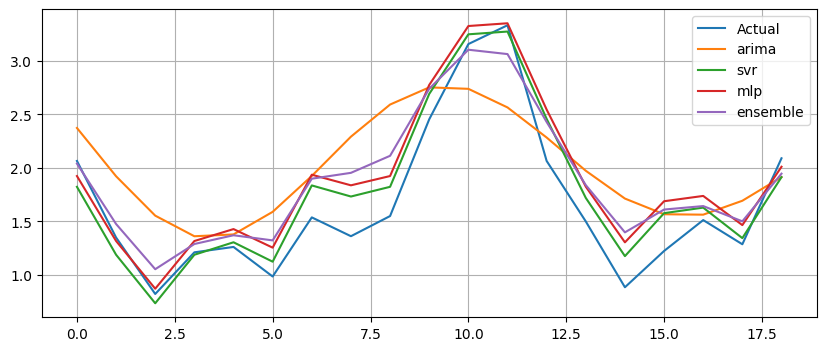

Generation 18: Fitness = 2.55612




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1490751412962887
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.0838276549056691
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.68160022001844
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791027266310676
ArimaModel {'p': 3, 'd': 0, 'q': 3} Fitness: 1.1682576966357863
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791027266310676
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791027266310676
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791027266310676
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6820802064625058
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791027266310676
SVRModel {'kernel': 'linear', 'c': 79.63131895826902, 'gamma': 'scale', 'epsilon': 0.42535854862953104} Fitness: 4.073026509807193
SVRModel {'kernel': 'linear', 'c': 87.89346358675769, 'gamma': 'scale', 'epsilon': 0.42535854862953104} Fitness: 4.080616132083873
SVRModel {'kernel': 'linear', 'c': 64.42380044496002, 'gamma': 'scale', 'epsilon': 0.425358548629531

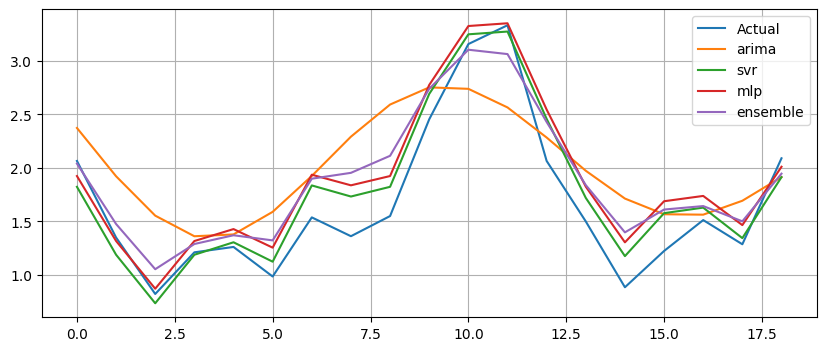

Generation 19: Fitness = 2.55612




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791027266310676
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1490751412962887
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791027266310676
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791027266310676
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1490751412962887
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791590150035094
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791027266310676
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791027266310676
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791027266310676
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791027266310676
SVRModel {'kernel': 'linear', 'c': 80.98552112545873, 'gamma': 'scale', 'epsilon': 0.42535854862953104} Fitness: 4.0542154341399
SVRModel {'kernel': 'linear', 'c': 86.53926141956798, 'gamma': 'scale', 'epsilon': 0.42535854862953104} Fitness: 4.073026509807193
SVRModel {'kernel': 'linear', 'c': 73.57119106844732, 'gamma': 'scale', 'epsilon': 0.425358548629531

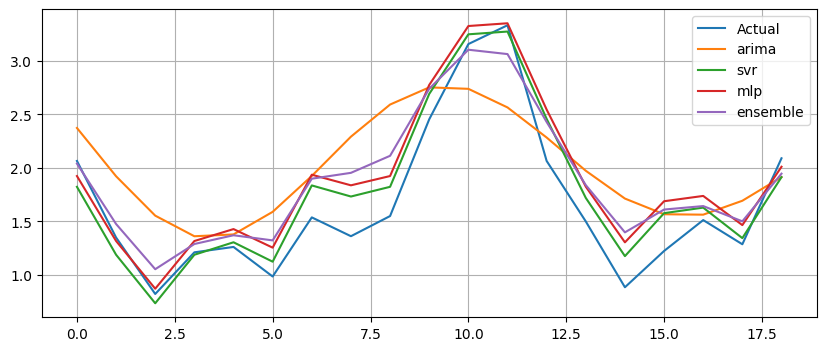

Generation 20: Fitness = 2.55612




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791027266310676
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791027266310676
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.68160022001844
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791027266310676
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791027266310676
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791027266310676
ArimaModel {'p': 4, 'd': 0, 'q': 1} Fitness: 1.092542867150946
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791027266310676
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791200549924852
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791027266310676
SVRModel {'kernel': 'linear', 'c': 79.63131895826902, 'gamma': 'scale', 'epsilon': 0.42535854862953104} Fitness: 4.0542154341399
SVRModel {'kernel': 'linear', 'c': 79.63131895826902, 'gamma': 'scale', 'epsilon': 0.42535854862953104} Fitness: 4.0542154341399
SVRModel {'kernel': 'linear', 'c': 82.35840363973608, 'gamma': 'scale', 'epsilon': 0.42535854862953104} F

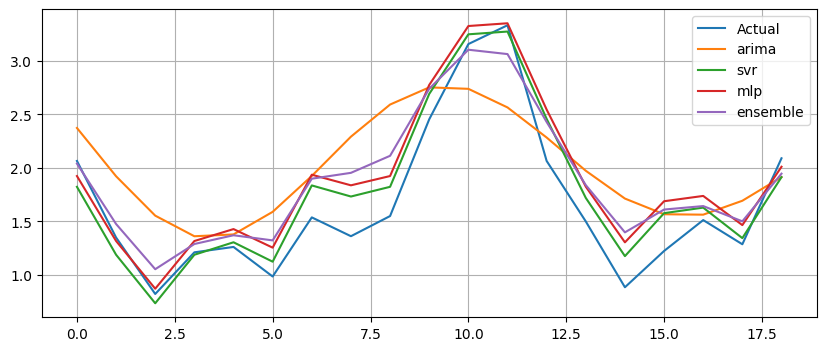

Generation 21: Fitness = 2.55612




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791200549924852
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791027266310676
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791027266310676
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791027266310676
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2460240891493466
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791027266310676
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6790764199209143
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791027266310676
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791027266310676
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791027266310676
SVRModel {'kernel': 'linear', 'c': 82.95883064526643, 'gamma': 'scale', 'epsilon': 0.42535854862953104} Fitness: 4.054553901326509
SVRModel {'kernel': 'linear', 'c': 80.38074374156471, 'gamma': 'scale', 'epsilon': 0.42535854862953104} Fitness: 4.0542154341399
SVRModel {'kernel': 'linear', 'c': 72.38624664061948, 'gamma': 'scale', 'epsilon': 0.425358548629531

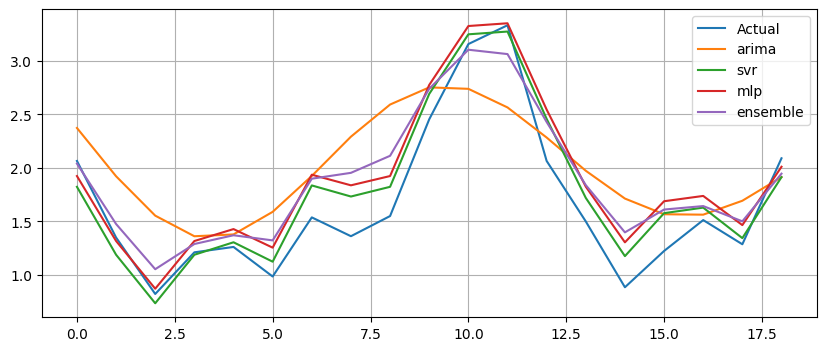

Generation 22: Fitness = 2.55612




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791027266310676
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791027266310676
ArimaModel {'p': 3, 'd': 0, 'q': 3} Fitness: 1.1689367025776412
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6790904401057813
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6789876110072368
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791027266310676
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6844405249700252
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791027266310676
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6844405249700252
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6777447575982536
SVRModel {'kernel': 'linear', 'c': 80.15746983159413, 'gamma': 'scale', 'epsilon': 0.42535854862953104} Fitness: 4.0542154341399
SVRModel {'kernel': 'linear', 'c': 72.39976812903812, 'gamma': 'scale', 'epsilon': 0.42535854862953104} Fitness: 4.0542154341399
SVRModel {'kernel': 'linear', 'c': 76.50536166059591, 'gamma': 'scale', 'epsilon': 0.32441421525553593

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


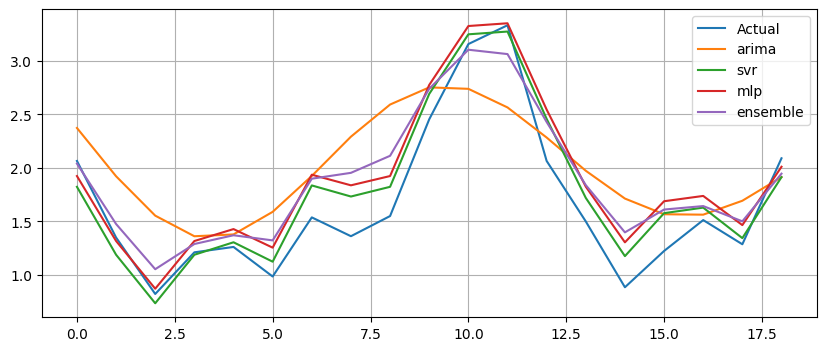

Generation 23: Fitness = 2.55612




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.68160022001844
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791027266310676
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791528783063105
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791452577988861
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791027266310676
ArimaModel {'p': 1, 'd': 0, 'q': 3} Fitness: 1.0708048146384463
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791027266310676
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791027266310676
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791027266310676
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791027266310676
SVRModel {'kernel': 'linear', 'c': 82.95883064526643, 'gamma': 'scale', 'epsilon': 0.42535854862953104} Fitness: 4.054634513172617
SVRModel {'kernel': 'linear', 'c': 82.95883064526643, 'gamma': 'scale', 'epsilon': 0.42535854862953104} Fitness: 4.0542154341399
SVRModel {'kernel': 'linear', 'c': 78.146515074697, 'gamma': 'scale', 'epsilon': 0.4150490752825998} F

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


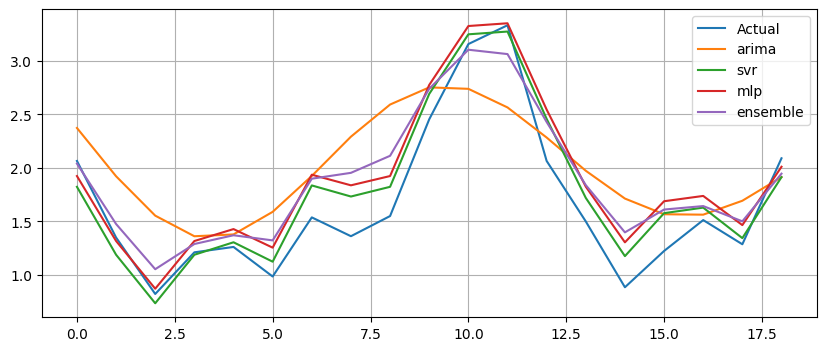

Generation 24: Fitness = 2.55612




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791027266310676
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791027266310676
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791027266310676
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791027266310676
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6792699117022212
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791027266310676
ArimaModel {'p': 3, 'd': 0, 'q': 3} Fitness: 1.1682576966357863
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791027266310676
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791027266310676
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791027266310676
SVRModel {'kernel': 'linear', 'c': 73.43696428857885, 'gamma': 'scale', 'epsilon': 0.42535854862953104} Fitness: 4.0542154341399
SVRModel {'kernel': 'linear', 'c': 82.95883064526643, 'gamma': 'scale', 'epsilon': 0.42535854862953104} Fitness: 4.0542154341399
SVRModel {'kernel': 'linear', 'c': 82.35047409159665, 'gamma': 'scale', 'epsilon': 0.42535854862953104

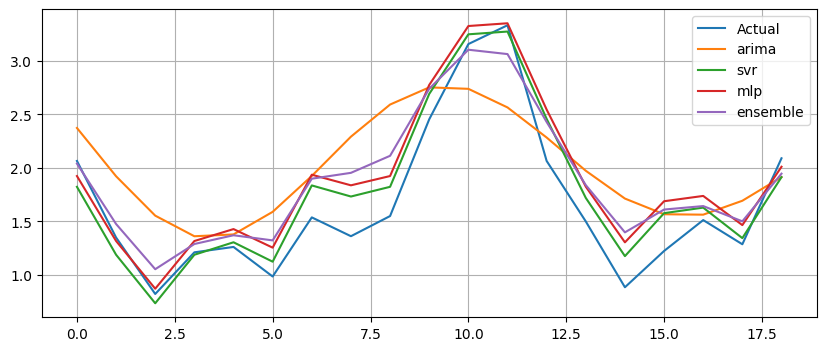

Generation 25: Fitness = 2.55612




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791027266310676
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791027266310676
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791027266310676
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.0838276549056691
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791027266310676
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791027266310676
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791027266310676
ArimaModel {'p': 4, 'd': 0, 'q': 1} Fitness: 1.0887073308246855
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791027266310676
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6875235400192536
SVRModel {'kernel': 'linear', 'c': 82.95883064526643, 'gamma': 'scale', 'epsilon': 0.42535854862953104} Fitness: 4.0542154341399
SVRModel {'kernel': 'linear', 'c': 82.95883064526643, 'gamma': 'scale', 'epsilon': 0.42535854862953104} Fitness: 4.0542154341399
SVRModel {'kernel': 'linear', 'c': 74.45877246062216, 'gamma': 'scale', 'epsilon': 0.42535854862953104

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


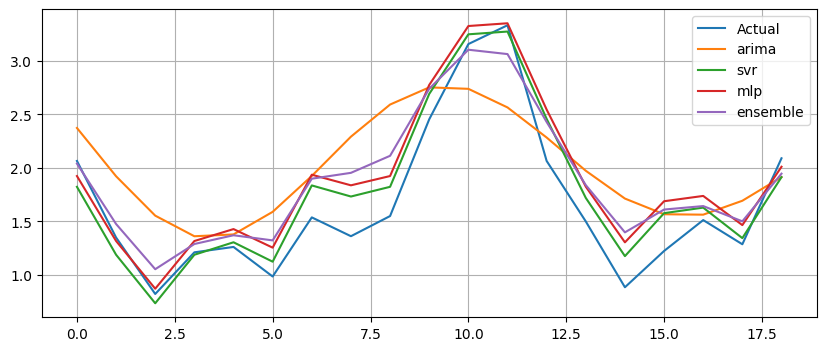

Generation 26: Fitness = 2.55612




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791027266310676
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6789696390428603
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791027266310676
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791027266310676
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791027266310676
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6792248506697833
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791027266310676
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791027266310676
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6788051245838151
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821702018140685
SVRModel {'kernel': 'linear', 'c': 79.53119181509746, 'gamma': 'scale', 'epsilon': 0.42535854862953104} Fitness: 4.0542154341399
SVRModel {'kernel': 'linear', 'c': 81.93702247322312, 'gamma': 'scale', 'epsilon': 0.4003789010555029} Fitness: 3.574941082786028
SVRModel {'kernel': 'linear', 'c': 79.53119181509746, 'gamma': 'scale', 'epsilon': 0.4253585486295310

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


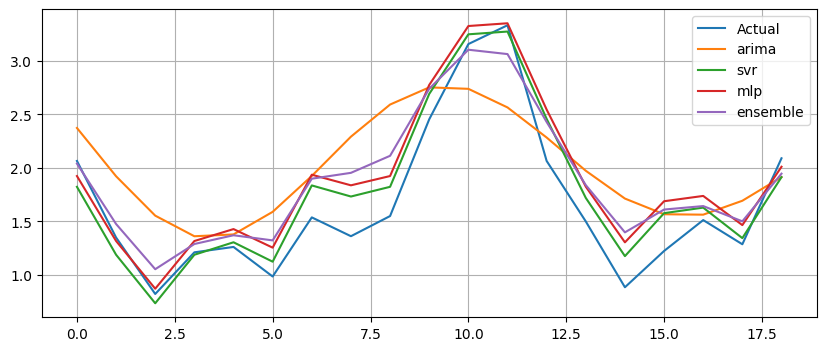

Generation 27: Fitness = 2.55612




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6792042681494816
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791027266310676
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6790757563209238
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.152405963002241
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.0838276549056691
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791463000215194
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791027266310676
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791027266310676
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791027266310676
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791027266310676
SVRModel {'kernel': 'linear', 'c': 82.04081026486888, 'gamma': 'scale', 'epsilon': 0.42535854862953104} Fitness: 4.055259466573167
SVRModel {'kernel': 'linear', 'c': 79.53119181509746, 'gamma': 'scale', 'epsilon': 0.42535854862953104} Fitness: 4.0542154341399
SVRModel {'kernel': 'linear', 'c': 75.41437647093746, 'gamma': 'scale', 'epsilon': 0.4253585486295310

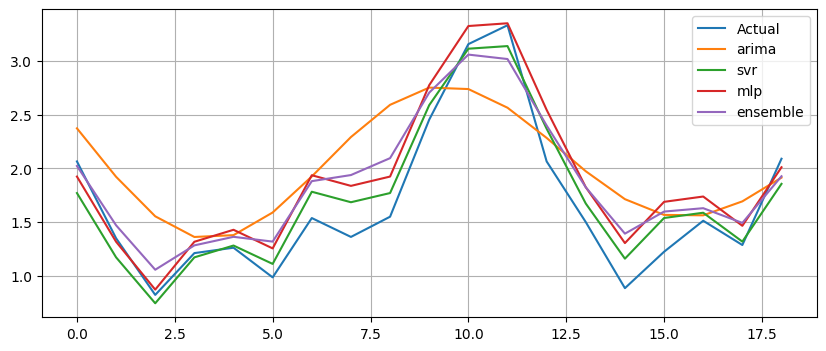

Generation 28: Fitness = 2.61754




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 0, 'd': 0, 'q': 3} Fitness: 0.8847742655789668
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791027266310676
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.68160022001844
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791463000215194
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6792456673220035
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791027266310676
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791027266310676
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.679075529802517
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6846693062143836
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6792201861128986
SVRModel {'kernel': 'linear', 'c': 75.41437647093746, 'gamma': 'scale', 'epsilon': 0.42535854862953104} Fitness: 4.214023126998606
SVRModel {'kernel': 'linear', 'c': 82.95883064526643, 'gamma': 'scale', 'epsilon': 0.42535854862953104} Fitness: 4.0542154341399
SVRModel {'kernel': 'linear', 'c': 80.76051629042144, 'gamma': 'scale', 'epsilon': 0.42535854862953104}

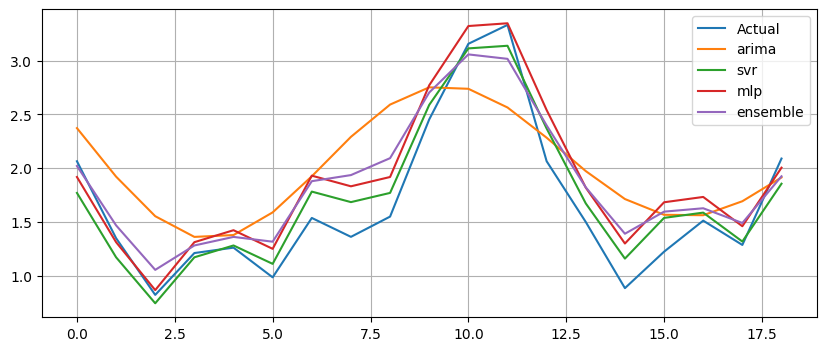

Generation 29: Fitness = 2.62675




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6792118393750355
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1488582355835086
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791027266310676
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791546467593828
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.679220260328535
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6792011947068581
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791027266310676
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.67759037230292
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791086864444478
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.679157815192527
SVRModel {'kernel': 'linear', 'c': 80.8114857895449, 'gamma': 'scale', 'epsilon': 0.47415016799914733} Fitness: 4.483058307191034
SVRModel {'kernel': 'linear', 'c': 79.53119181509746, 'gamma': 'scale', 'epsilon': 0.4676615323672941} Fitness: 4.484544965176127
SVRModel {'kernel': 'linear', 'c': 80.76051629042144, 'gamma': 'scale', 'epsilon': 0.42535854862953104} 

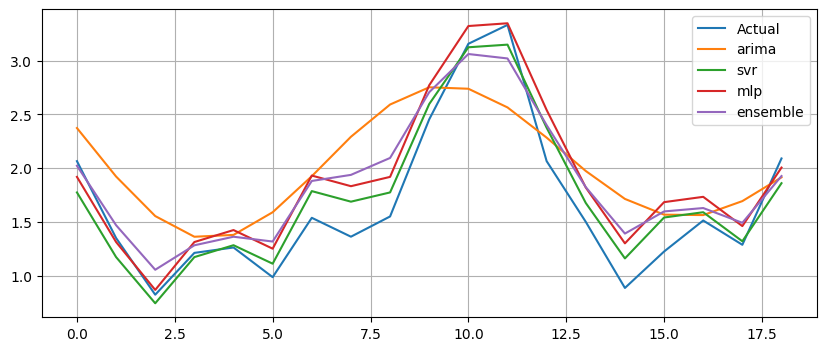

Generation 30: Fitness = 2.62385




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6792233545460429
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6792118393750355
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791546467593828
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791742257979638
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6801858969903882
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1488582355835086
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6768476447551737
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.7019380512459115
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791907569715876
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791722573997958
SVRModel {'kernel': 'linear', 'c': 77.95701964739901, 'gamma': 'scale', 'epsilon': 0.4655455497139116} Fitness: 4.459904340321631
SVRModel {'kernel': 'linear', 'c': 78.26884261308335, 'gamma': 'scale', 'epsilon': 0.47415016799914733} Fitness: 4.483058307191034
SVRModel {'kernel': 'linear', 'c': 79.53119181509746, 'gamma': 'scale', 'epsilon': 0.46766153236729

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


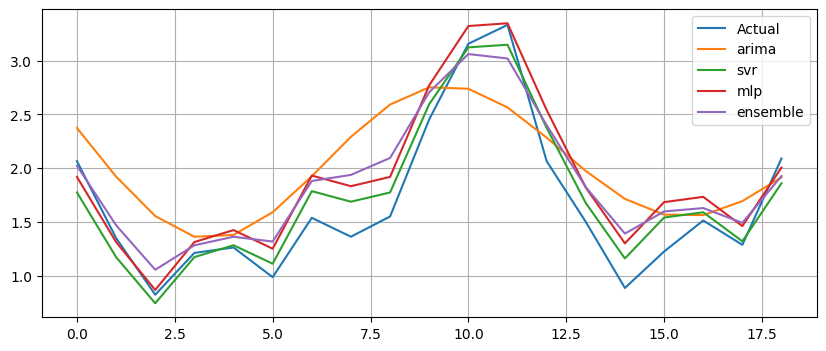

Generation 31: Fitness = 2.62409




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.67915387384538
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6792194131988958
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1488582355835086
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6792194131988958
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6792211145387386
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791990103827397
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6810877615687105
ArimaModel {'p': 1, 'd': 0, 'q': 3} Fitness: 1.0689314557892067
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791547063598367
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791977487255334
SVRModel {'kernel': 'linear', 'c': 79.92272104631155, 'gamma': 'scale', 'epsilon': 0.4682011806936675} Fitness: 4.467505593182538
SVRModel {'kernel': 'linear', 'c': 79.92272104631155, 'gamma': 'scale', 'epsilon': 0.4682011806936675} Fitness: 4.467434432835319
SVRModel {'kernel': 'linear', 'c': 79.61365886912824, 'gamma': 'scale', 'epsilon': 0.4676615323672941}

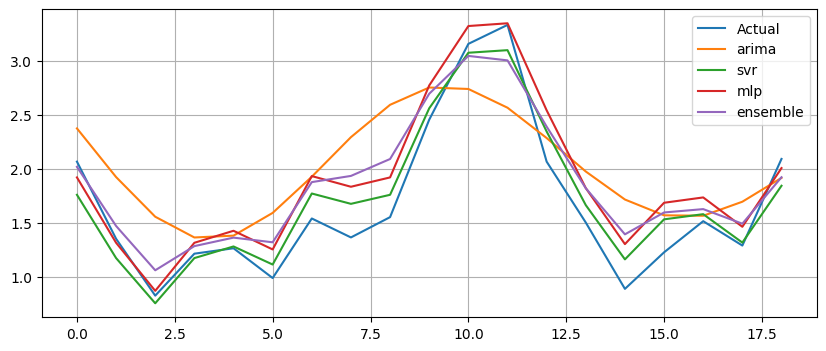

Generation 32: Fitness = 2.63754




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6866543985961882
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2385123274638659
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.68477347259843
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.679200009650234
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.0827364951846945
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.0830553219703376
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6792196136088238
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6792196647962143
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1487134083379957
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6792151326720626
SVRModel {'kernel': 'rbf', 'c': 79.37424188315927, 'gamma': 'scale', 'epsilon': 0.48201994169482465} Fitness: 1.5003438477066773
SVRModel {'kernel': 'linear', 'c': 79.73743554460545, 'gamma': 'scale', 'epsilon': 0.485343047959666} Fitness: 4.52269704383573
SVRModel {'kernel': 'linear', 'c': 79.37085943750257, 'gamma': 'scale', 'epsilon': 0.47668145022557074} Fi

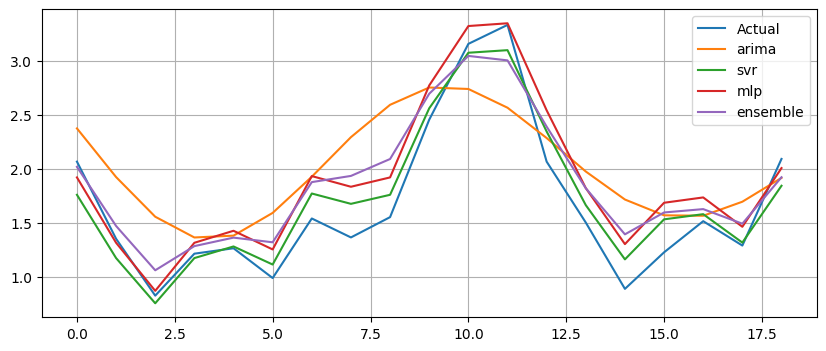

Generation 33: Fitness = 2.63754




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791990103827397
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791990103827397
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791918954123701
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.679202124293399
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.679202294728997
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.679202294728997
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791990103827397
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6792196136088238
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.679202294728997
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791990103827397
SVRModel {'kernel': 'linear', 'c': 61.08566919584537, 'gamma': 'scale', 'epsilon': 0.4993838056810188} Fitness: 4.529112640016152
SVRModel {'kernel': 'linear', 'c': 74.00738772962714, 'gamma': 'scale', 'epsilon': 0.4993838056810188} Fitness: 4.529112640016152
SVRModel {'kernel': 'linear', 'c': 79.61365886912824, 'gamma': 'scale', 'epsilon': 0.4903638878227421} F

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


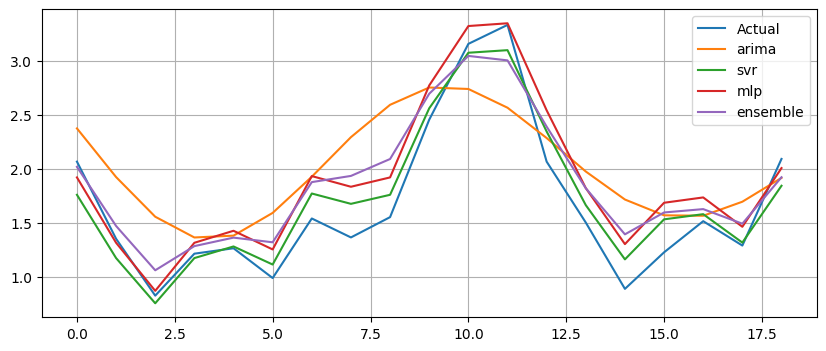

Generation 34: Fitness = 2.63754




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791990103827397
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.679200009650234
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791960883629238
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6792896786690676
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791990103827397
ArimaModel {'p': 1, 'd': 0, 'q': 3} Fitness: 1.0646796850463585
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791990103827397
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791990103827397
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1487856370336742
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6792016533392031
SVRModel {'kernel': 'linear', 'c': 79.55316372962422, 'gamma': 'scale', 'epsilon': 0.4993838056810188} Fitness: 4.529112640016152
SVRModel {'kernel': 'linear', 'c': 79.10312962246095, 'gamma': 'scale', 'epsilon': 0.4903638878227421} Fitness: 4.516523856503034
SVRModel {'kernel': 'linear', 'c': 75.28541743180365, 'gamma': 'scale', 'epsilon': 0.4993838056810188

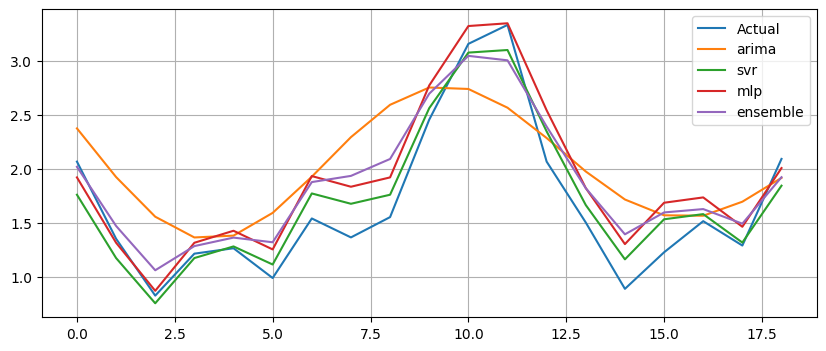

Generation 35: Fitness = 2.63718




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6792274595707644
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6856278576831567
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791037763269945
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791989890383536
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.0846211224537912
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791990103827397
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791989946226766
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791989435299042
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791989329872397
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 2.109064308645621
SVRModel {'kernel': 'linear', 'c': 76.39073316717494, 'gamma': 'scale', 'epsilon': 0.4629985896635099} Fitness: 4.4523672274135295
SVRModel {'kernel': 'linear', 'c': 78.12112423252358, 'gamma': 'scale', 'epsilon': 0.4993838056810188} Fitness: 4.5418419005072295
SVRModel {'kernel': 'linear', 'c': 78.12112423252358, 'gamma': 'scale', 'epsilon': 0.49871778585822

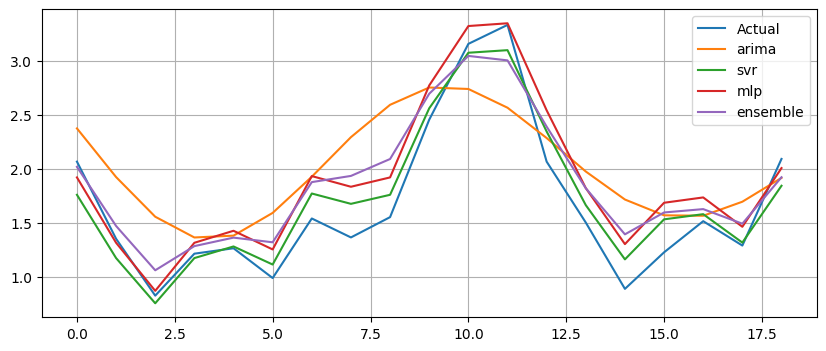

Generation 36: Fitness = 2.63754




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791990103827397
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791990103827397
ArimaModel {'p': 4, 'd': 0, 'q': 1} Fitness: 1.0901952221181732
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6790842982831307
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791990103827397
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791990103827397
ArimaModel {'p': 0, 'd': 0, 'q': 3} Fitness: 0.8657837919041026
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791989890383536
ArimaModel {'p': 2, 'd': 0, 'q': 3} Fitness: 1.1631617735952962
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791990103827397
SVRModel {'kernel': 'linear', 'c': 79.11473302918107, 'gamma': 'scale', 'epsilon': 0.4993838056810188} Fitness: 4.529112640016152
SVRModel {'kernel': 'linear', 'c': 78.12112423252358, 'gamma': 'scale', 'epsilon': 0.4993838056810188} Fitness: 4.529112640016152
SVRModel {'kernel': 'linear', 'c': 77.40542890456373, 'gamma': 'scale', 'epsilon': 0.499383805681018

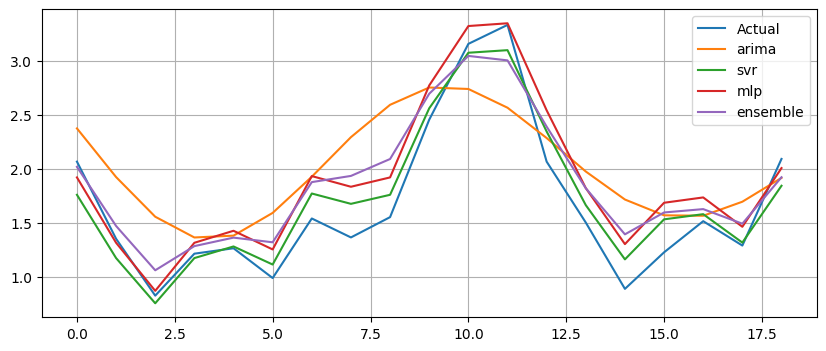

Generation 37: Fitness = 2.63754




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791990103827397
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791990103827397
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791990103827397
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791990103827397
ArimaModel {'p': 0, 'd': 0, 'q': 3} Fitness: 0.8657837919041026
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791990103827397
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791990103827397
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791990103827397
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818929133684368
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791990103827397
SVRModel {'kernel': 'linear', 'c': 77.27424107148437, 'gamma': 'scale', 'epsilon': 0.4993838056810188} Fitness: 4.529112640016152
SVRModel {'kernel': 'linear', 'c': 71.75806092655998, 'gamma': 'scale', 'epsilon': 0.4993838056810188} Fitness: 4.529112640016152
SVRModel {'kernel': 'linear', 'c': 77.36288598255872, 'gamma': 'scale', 'epsilon': 0.499383805681018

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


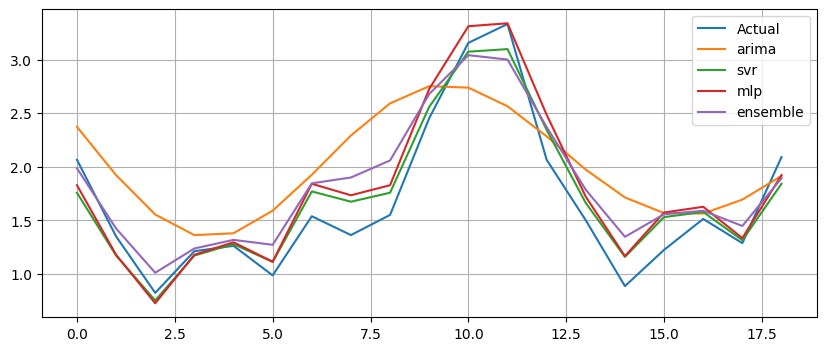

Generation 38: Fitness = 2.86188




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791990103827397
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6820637020513527
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791990103827397
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791990103827397
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791990103827397
ArimaModel {'p': 4, 'd': 0, 'q': 1} Fitness: 1.0898489885325224
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818929133684368
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6857126080130111
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791990103827397
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791990103827397
SVRModel {'kernel': 'linear', 'c': 77.27424107148437, 'gamma': 'scale', 'epsilon': 0.4993838056810188} Fitness: 4.529112640016152
SVRModel {'kernel': 'linear', 'c': 77.36288598255872, 'gamma': 'scale', 'epsilon': 0.4993838056810188} Fitness: 4.536044402175606
SVRModel {'kernel': 'linear', 'c': 77.36288598255872, 'gamma': 'scale', 'epsilon': 0.499383805681018

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


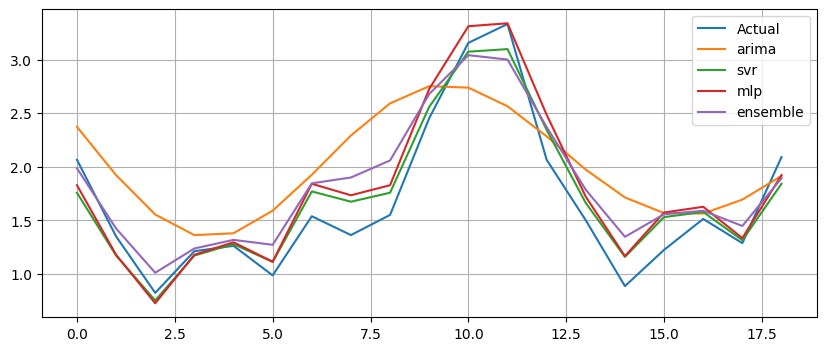

Generation 39: Fitness = 2.86188




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1537333778785568
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818929133684368
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791989842816561
ArimaModel {'p': 2, 'd': 0, 'q': 3} Fitness: 1.1658600976878313
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791990103827397
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791990103827397
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791990103827397
ArimaModel {'p': 0, 'd': 0, 'q': 3} Fitness: 0.8684965916883207
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818929133684368
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791990103827397
SVRModel {'kernel': 'rbf', 'c': 77.36288598255872, 'gamma': 'scale', 'epsilon': 0.4993838056810188} Fitness: 1.503897925256161
SVRModel {'kernel': 'linear', 'c': 78.10170063464093, 'gamma': 'scale', 'epsilon': 0.4993838056810188} Fitness: 4.528195006292034
SVRModel {'kernel': 'linear', 'c': 77.28770946479015, 'gamma': 'scale', 'epsilon': 0.49513159324424816}

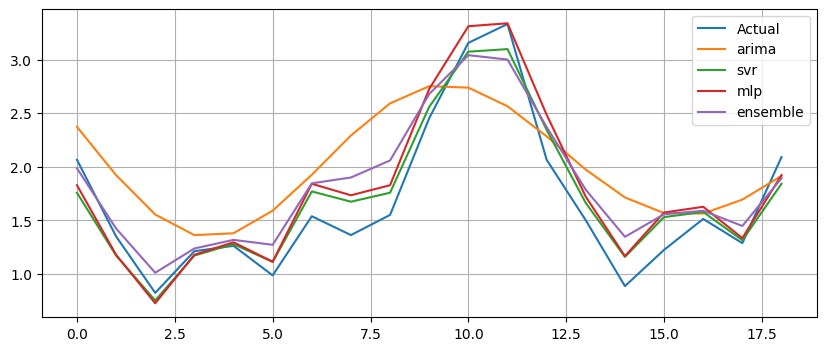

Generation 40: Fitness = 2.86188




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2421656061874466
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6857126080130111
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818929133684368
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818929133684368
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791758072299026
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6776063734002264
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.681669524921969
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818929133684368
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818929133684368
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.088483033467831
SVRModel {'kernel': 'linear', 'c': 77.27566176631294, 'gamma': 'scale', 'epsilon': 0.4993838056810188} Fitness: 4.542970398900791
SVRModel {'kernel': 'linear', 'c': 77.28628876996157, 'gamma': 'scale', 'epsilon': 0.4993838056810188} Fitness: 4.54237789999902
SVRModel {'kernel': 'linear', 'c': 87.09871529053305, 'gamma': 'scale', 'epsilon': 0.4993838056810188} 

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


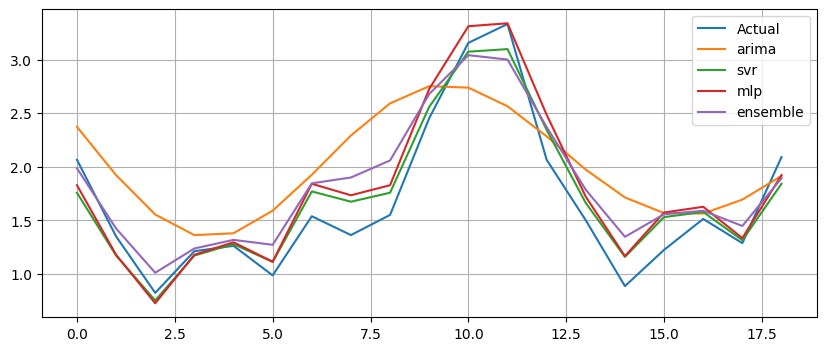

Generation 41: Fitness = 2.86188




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6817950234255805
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.088301713073277
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818929133684368
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818929133684368
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818929133684368
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818929133684368
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818929133684368
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818739386902672
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791758072299026
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6792896786690676
SVRModel {'kernel': 'linear', 'c': 77.34941758925294, 'gamma': 'scale', 'epsilon': 0.4993838056810188} Fitness: 4.528264430903346
SVRModel {'kernel': 'linear', 'c': 77.28770946479015, 'gamma': 'scale', 'epsilon': 0.4993838056810188} Fitness: 4.55342241540128
SVRModel {'kernel': 'linear', 'c': 77.28508292313299, 'gamma': 'scale', 'epsilon': 0.4993838056810188}

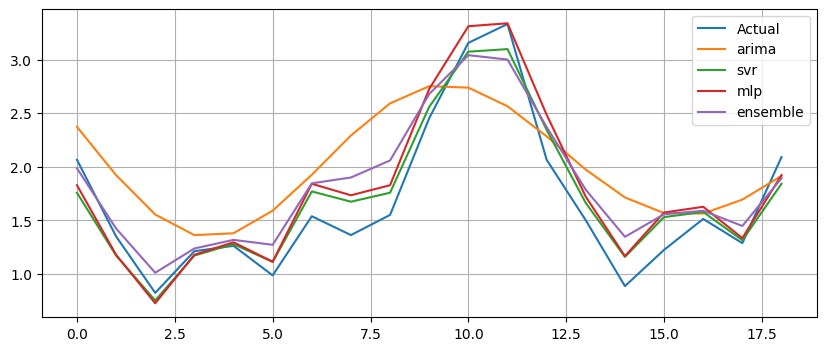

Generation 42: Fitness = 2.86188




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6900629042132254
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.681702656253628
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818929133684368
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818929133684368
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6817950234255805
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6817950234255805
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818929133684368
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818929133684368
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818929133684368
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 2.1118779180289913
SVRModel {'kernel': 'rbf', 'c': 77.28770946479015, 'gamma': 'scale', 'epsilon': 0.4993838056810188} Fitness: 1.4945194308910557
SVRModel {'kernel': 'linear', 'c': 77.27954365399049, 'gamma': 'scale', 'epsilon': 0.4993838056810188} Fitness: 4.528347537449515
SVRModel {'kernel': 'linear', 'c': 77.27954365399049, 'gamma': 'scale', 'epsilon': 0.4993838056810188} 

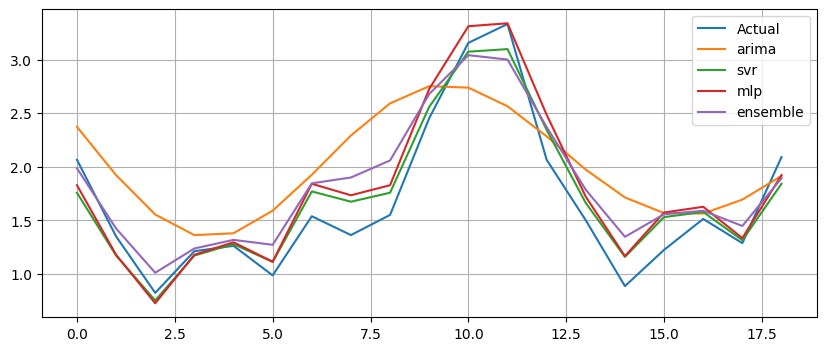

Generation 43: Fitness = 2.86188




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818185594146406
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.681863531900277
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682036424232116
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818929133684368
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818929133684368
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818929133684368
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818929133684368
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818929133684368
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818929133684368
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6810669055238272
SVRModel {'kernel': 'linear', 'c': 77.28049690787938, 'gamma': 'scale', 'epsilon': 0.4993838056810188} Fitness: 4.528248514772577
SVRModel {'kernel': 'linear', 'c': 77.34941758925294, 'gamma': 'scale', 'epsilon': 0.4993838056810188} Fitness: 4.528208324631076
SVRModel {'kernel': 'linear', 'c': 77.28049690787938, 'gamma': 'scale', 'epsilon': 0.4993838056810188}

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


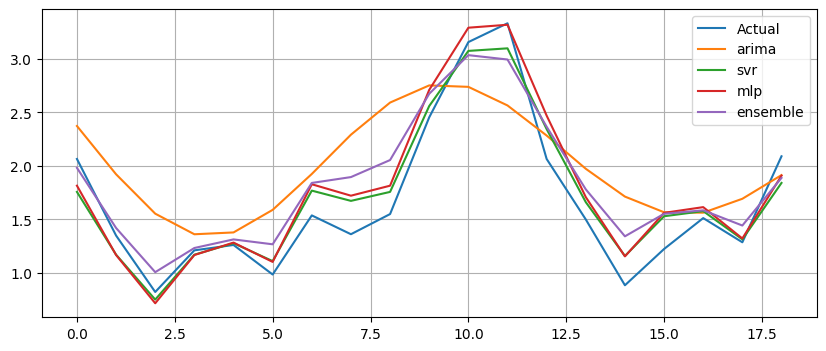

Generation 44: Fitness = 2.88157




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682036424232116
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818929133684368
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818929133684368
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682036424232116
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6857126080130111
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818929133684368
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1538849028043137
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818929133684368
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818048137744936
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6902989208418284
SVRModel {'kernel': 'linear', 'c': 77.28049690787938, 'gamma': 'scale', 'epsilon': 0.4993838056810188} Fitness: 4.528091627561184
SVRModel {'kernel': 'linear', 'c': 77.27954365399049, 'gamma': 'scale', 'epsilon': 0.4993838056810188} Fitness: 4.528195006292034
SVRModel {'kernel': 'linear', 'c': 77.28049690787938, 'gamma': 'scale', 'epsilon': 0.4993838056810188}

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


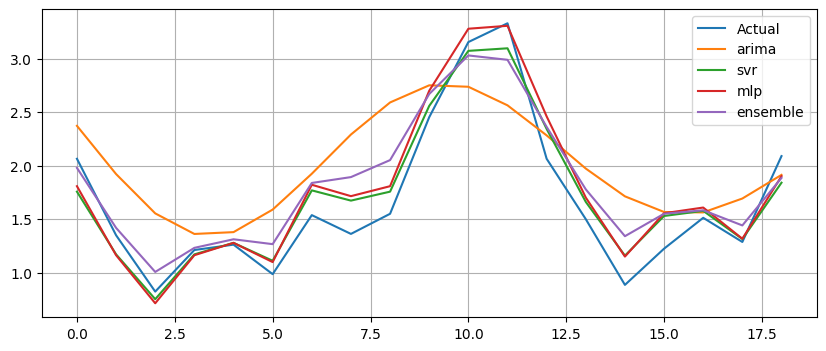

Generation 45: Fitness = 2.89285




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6819484334803354
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682036424232116
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682036424232116
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682036424232116
ArimaModel {'p': 2, 'd': 0, 'q': 3} Fitness: 1.1680756896364473
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818929133684368
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682036424232116
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6825008485011899
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818929133684368
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.68212892999704
SVRModel {'kernel': 'linear', 'c': 94.31357298558518, 'gamma': 'scale', 'epsilon': 0.4993838056810188} Fitness: 4.528156591881778
SVRModel {'kernel': 'linear', 'c': 77.34941758925294, 'gamma': 'scale', 'epsilon': 0.4993838056810188} Fitness: 4.528091627561184
SVRModel {'kernel': 'linear', 'c': 72.69596932987199, 'gamma': 'scale', 'epsilon': 0.4993838056810188} Fit

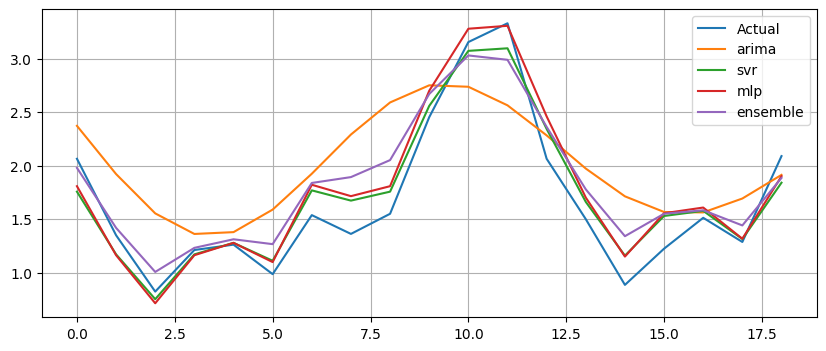

Generation 46: Fitness = 2.89285




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 0, 'q': 3} Fitness: 1.1713550032285813
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682036424232116
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.68212892999704
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.154761803690346
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682036424232116
ArimaModel {'p': 4, 'd': 0, 'q': 0} Fitness: 1.0913794110658115
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6820666059956768
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682098598872982
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.68212892999704
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682036424232116
SVRModel {'kernel': 'linear', 'c': 77.32728873680571, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.54748242532024
SVRModel {'kernel': 'linear', 'c': 77.3026257603266, 'gamma': 'scale', 'epsilon': 0.4993838056810188} Fitness: 4.528091627561184
SVRModel {'kernel': 'linear', 'c': 82.57918385119879, 'gamma': 'scale', 'epsilon': 0.4993838056810188} Fitness: 4.528044899153

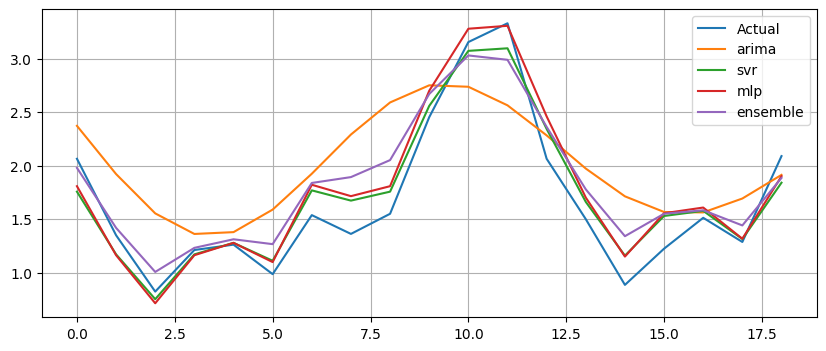

Generation 47: Fitness = 2.89285




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6820760904775698
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2421489025493748
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.68212892999704
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6794290601135302
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682113396629775
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682115886301611
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682074042091821
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6825215487705407
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.088750852135262
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821277141361393
SVRModel {'kernel': 'linear', 'c': 80.09221722208864, 'gamma': 'scale', 'epsilon': 0.4773382993448905} Fitness: 4.489750238776285
SVRModel {'kernel': 'linear', 'c': 80.09221722208864, 'gamma': 'scale', 'epsilon': 0.4993838056810188} Fitness: 4.5428202917619025
SVRModel {'kernel': 'linear', 'c': 77.34941758925294, 'gamma': 'scale', 'epsilon': 0.4993838056810188} Fi

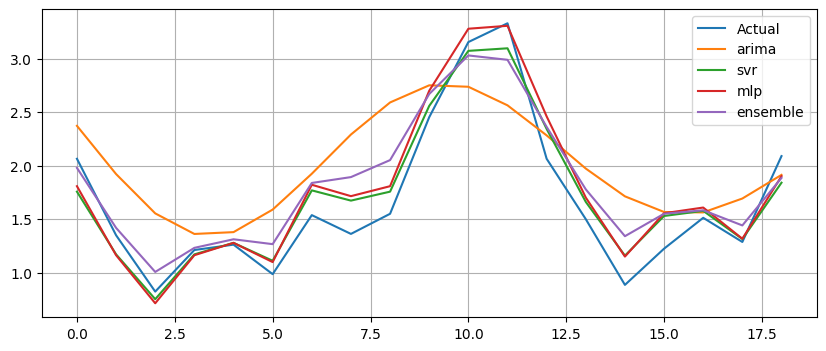

Generation 48: Fitness = 2.89285




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6819006991324739
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6766968762561552
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 2.1119794922122406
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821276367848923
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821283832790315
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821283382455092
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6816443054905852
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682099898807654
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.679428808633873
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821278249717333
SVRModel {'kernel': 'linear', 'c': 77.28049690787938, 'gamma': 'scale', 'epsilon': 0.4993838056810188} Fitness: 4.52818937642247
SVRModel {'kernel': 'linear', 'c': 71.83442027520594, 'gamma': 'scale', 'epsilon': 0.4993838056810188} Fitness: 4.535580892093749
SVRModel {'kernel': 'poly', 'c': 75.96588830599777, 'gamma': 'scale', 'epsilon': 0.4993838056810188} Fi

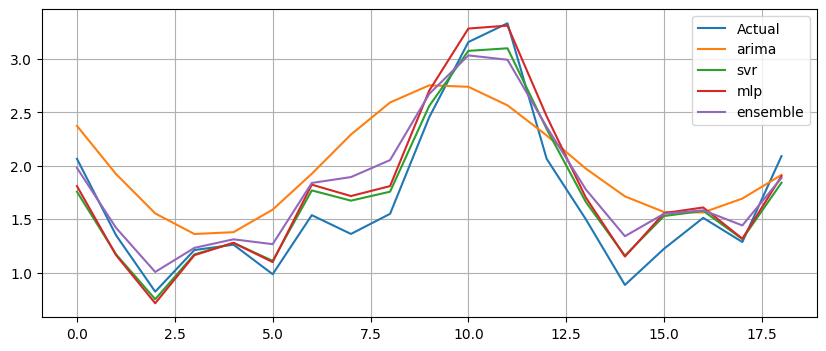

Generation 49: Fitness = 2.89101




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6854968665931112
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6820313565826086
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.7015991294930437
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821849217243467
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821159311946987
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6825209361196978
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821161352466902
ArimaModel {'p': 4, 'd': 0, 'q': 0} Fitness: 1.091422544927498
ArimaModel {'p': 4, 'd': 0, 'q': 1} Fitness: 1.0946156300868464
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6820999444304203
SVRModel {'kernel': 'linear', 'c': 77.32728873680571, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.540535313008257
SVRModel {'kernel': 'linear', 'c': 77.32728873680571, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5287911145384445
SVRModel {'kernel': 'linear', 'c': 76.23000223198511, 'gamma': 'scale', 'epsilon': 0.4993838056810188} Fitness: 4.561930187906327


/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


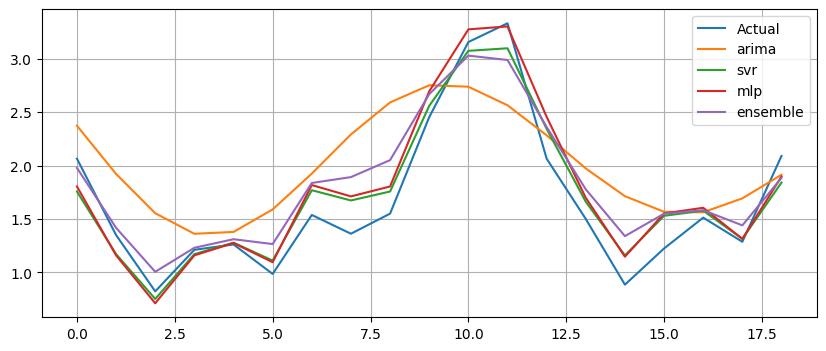

Generation 50: Fitness = 2.89939




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6820404521160432
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6945625452938156
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821281165688218
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818712392225497
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821331854327644
ArimaModel {'p': 1, 'd': 0, 'q': 3} Fitness: 1.0742091465411343
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682184979867074
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821159311886213
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821158949152812
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598827469477
SVRModel {'kernel': 'linear', 'c': 73.34624975858172, 'gamma': 'scale', 'epsilon': 0.49961905291149844} Fitness: 4.536865339327766
SVRModel {'kernel': 'rbf', 'c': 76.23000223198511, 'gamma': 'scale', 'epsilon': 0.4993838056810188} Fitness: 1.5222720500073819
SVRModel {'kernel': 'linear', 'c': 79.21856970663318, 'gamma': 'scale', 'epsilon': 0.4996247108717285}

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


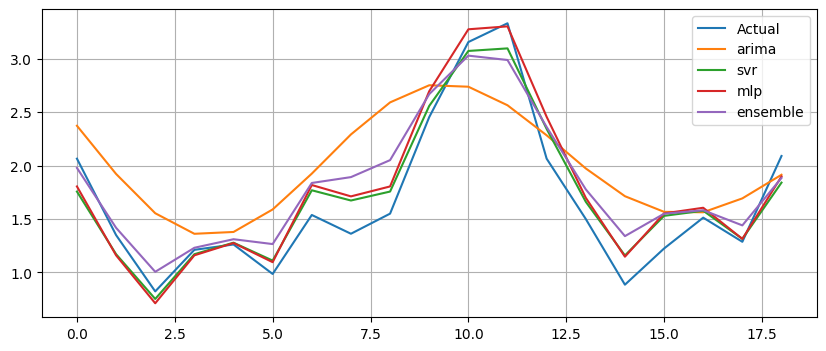

Generation 51: Fitness = 2.89893




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6819923896771702
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6815781412325916
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821788565617999
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.088776254111761
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821788640473834
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682184979867074
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682159874181709
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682159874181709
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821788858683393
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821332521407306
SVRModel {'kernel': 'linear', 'c': 79.21856970663318, 'gamma': 'scale', 'epsilon': 0.4996247108717285} Fitness: 4.5283924609415855
SVRModel {'kernel': 'linear', 'c': 77.32728873680571, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529154556197646
SVRModel {'kernel': 'linear', 'c': 78.16277399971287, 'gamma': 'scale', 'epsilon': 0.49970028314971215} Fitness: 4.528

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


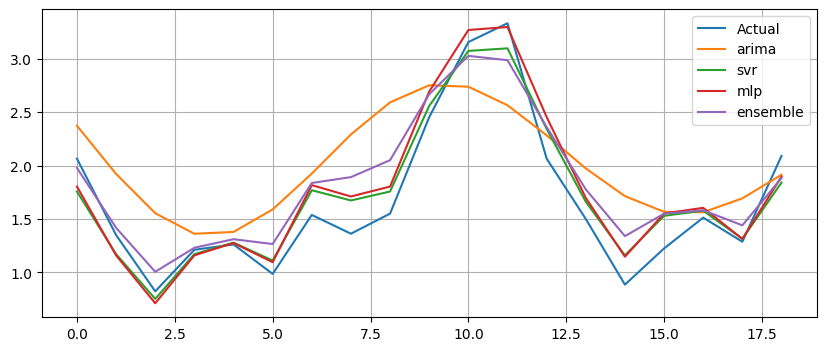

Generation 52: Fitness = 2.89940




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 2.1115372313474583
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 2.111445375548326
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.6034280594000216
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6815090960993666
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821788858683393
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821849782280378
ArimaModel {'p': 2, 'd': 0, 'q': 3} Fitness: 1.1680826703606502
ArimaModel {'p': 4, 'd': 0, 'q': 0} Fitness: 1.0913832646050206
ArimaModel {'p': 4, 'd': 0, 'q': 0} Fitness: 1.091380239074155
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682178875664064
SVRModel {'kernel': 'poly', 'c': 77.32728873680571, 'gamma': 'scale', 'epsilon': 0.49986000527646945} Fitness: 1.1319727735591099
SVRModel {'kernel': 'poly', 'c': 77.32728873680571, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 1.1317792052902387
SVRModel {'kernel': 'poly', 'c': 76.23000223198511, 'gamma': 'scale', 'epsilon': 0.49992329778558897} Fitness: 1.240475

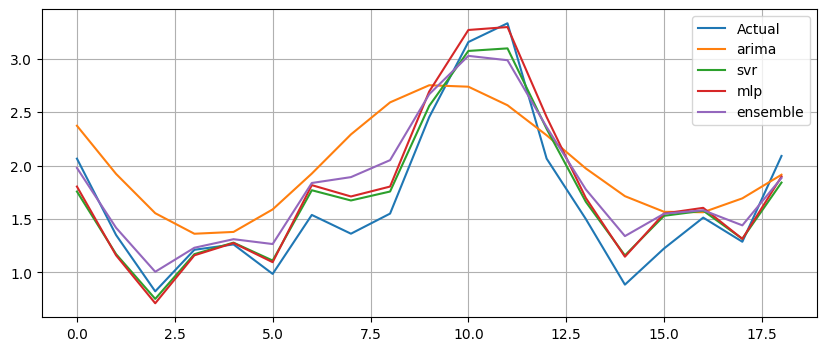

Generation 53: Fitness = 2.89945




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682159879424611
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598758037966
ArimaModel {'p': 0, 'd': 0, 'q': 3} Fitness: 0.9104919079011772
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 2.1108782189746287
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1445482797947
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6817377701240201
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821201970558481
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598931410384
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1539957440684454
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598725426727
SVRModel {'kernel': 'linear', 'c': 77.25549586826295, 'gamma': 'scale', 'epsilon': 0.4998989194190943} Fitness: 4.528586123870933
SVRModel {'kernel': 'linear', 'c': 76.26030430262757, 'gamma': 'scale', 'epsilon': 0.4998721038741001} Fitness: 4.5285561346643375
SVRModel {'kernel': 'linear', 'c': 77.31901445870942, 'gamma': 'scale', 'epsilon': 0.49985526068724095}

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


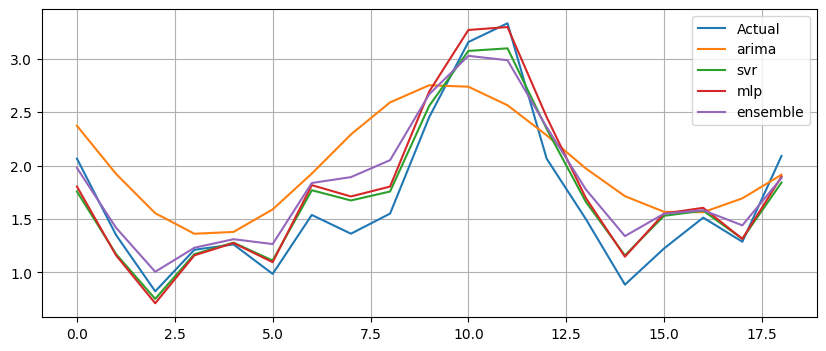

Generation 54: Fitness = 2.89940




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598929843737
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682159874568148
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.154963949550776
ArimaModel {'p': 0, 'd': 0, 'q': 3} Fitness: 0.9315549664090792
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6836036893314203
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598758917276
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598892797598
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598774917965
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6814541510632377
SVRModel {'kernel': 'linear', 'c': 76.3957532921562, 'gamma': 'scale', 'epsilon': 0.49999711281779263} Fitness: 4.528695601528233
SVRModel {'kernel': 'linear', 'c': 77.2361750741467, 'gamma': 'scale', 'epsilon': 0.4998628924586768} Fitness: 4.528545823951293
SVRModel {'kernel': 'linear', 'c': 77.31901445870942, 'gamma': 'scale', 'epsilon': 0.49985526068724095}

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


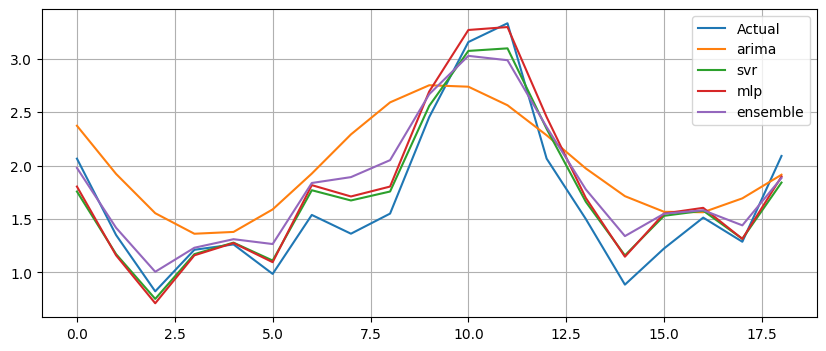

Generation 55: Fitness = 2.89940




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598822746482
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6812379558062418
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6825761881881847
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598735475505
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598735475505
ArimaModel {'p': 0, 'd': 0, 'q': 3} Fitness: 0.8474825686014682
ArimaModel {'p': 4, 'd': 0, 'q': 1} Fitness: 1.094536854686214
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598929843737
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598735475505
SVRModel {'kernel': 'linear', 'c': 77.30572661320731, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528698812486809
SVRModel {'kernel': 'linear', 'c': 69.15406548881116, 'gamma': 'scale', 'epsilon': 0.4999198451850352} Fitness: 4.528609498801475
SVRModel {'kernel': 'linear', 'c': 77.26063763316772, 'gamma': 'scale', 'epsilon': 0.4998861665012623} Fitness: 4.53

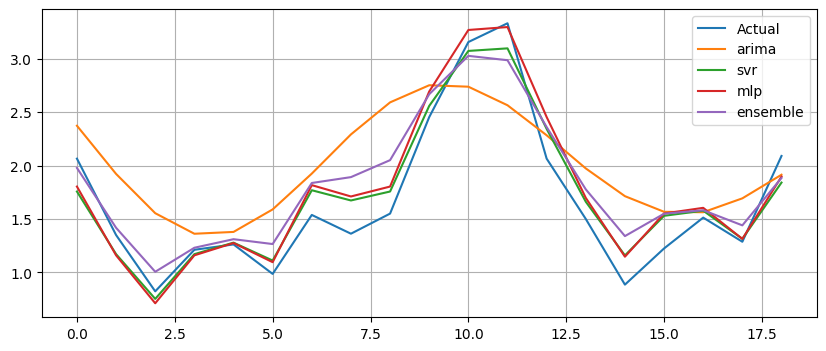

Generation 56: Fitness = 2.89941




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598793163983
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6819322374313115
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6854439029212065
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 0, 'd': 0, 'q': 3} Fitness: 0.8474749626240103
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682159882112347
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6817460956425405
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.686640755316194
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1549637342446029
ArimaModel {'p': 4, 'd': 0, 'q': 1} Fitness: 1.0945384505808626
SVRModel {'kernel': 'linear', 'c': 77.30834463259427, 'gamma': 'scale', 'epsilon': 0.4998981217701949} Fitness: 4.528585232388898
SVRModel {'kernel': 'linear', 'c': 77.27130745928287, 'gamma': 'scale', 'epsilon': 0.4998861665012623} Fitness: 4.528720791606008
SVRModel {'kernel': 'linear', 'c': 67.80133359317463, 'gamma': 'scale', 'epsilon': 0.4998861665012623}

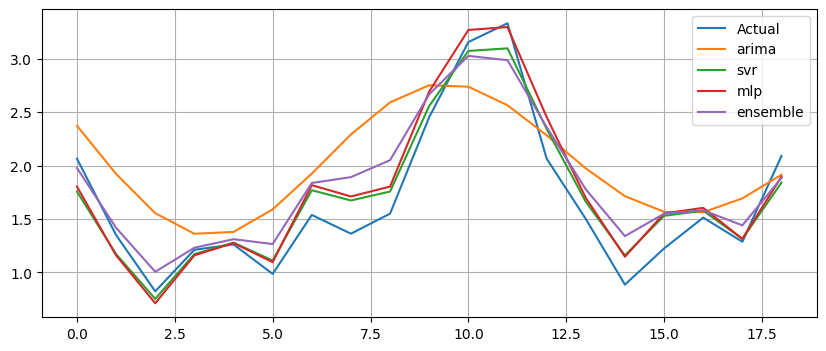

Generation 57: Fitness = 2.89944




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598782553917
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598882737052
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598793163983
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598888464813
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598776982285
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598776982285
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598776982285
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598776982285
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598816504995
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598864684326
SVRModel {'kernel': 'linear', 'c': 77.29075764698587, 'gamma': 'scale', 'epsilon': 0.49989028875185404} Fitness: 4.528576476060329
SVRModel {'kernel': 'linear', 'c': 77.27560659938916, 'gamma': 'scale', 'epsilon': 0.49996338650520594} Fitness: 4.5286580591417955
SVRModel {'kernel': 'linear', 'c': 77.26391123143169, 'gamma': 'scale', 'epsilon': 0.499898121770

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


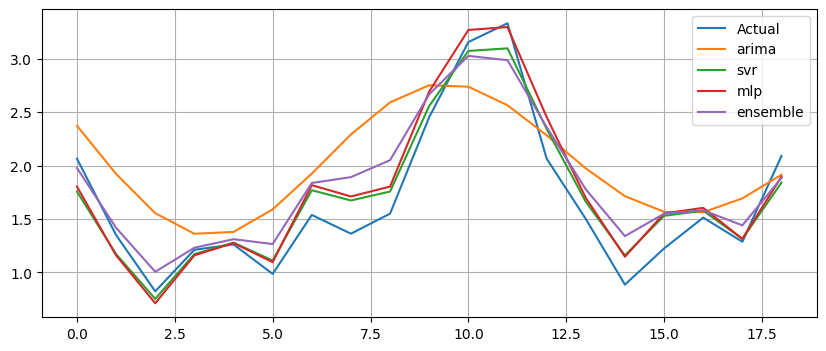

Generation 58: Fitness = 2.89944




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598888464813
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598888464813
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2420580775022771
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598888464813
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598888464813
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598888464813
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598824627537
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598856476836
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598830917868
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682159883371842
SVRModel {'kernel': 'linear', 'c': 77.30572661320731, 'gamma': 'scale', 'epsilon': 0.4999675087557977} Fitness: 4.528662651169496
SVRModel {'kernel': 'linear', 'c': 77.30572661320731, 'gamma': 'scale', 'epsilon': 0.4999675087557977} Fitness: 4.528662651169496
SVRModel {'kernel': 'linear', 'c': 77.27560659938916, 'gamma': 'scale', 'epsilon': 0.4999633865052059

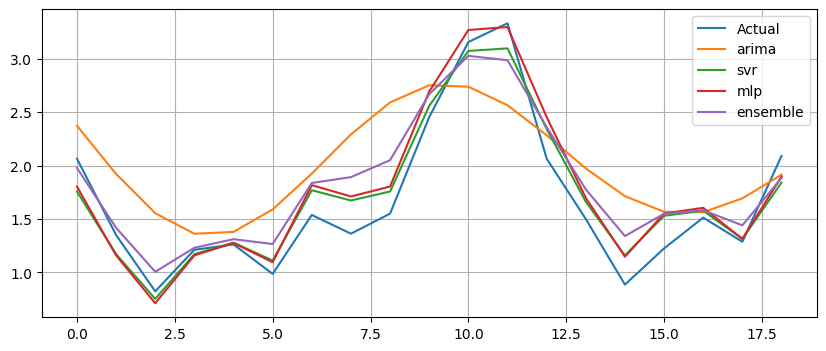

Generation 59: Fitness = 2.89944




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682159888559484
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598885604943
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6796078860046626
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598882737052
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598888464813
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.681502070176707
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598882737052
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598888464813
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598888464813
ArimaModel {'p': 0, 'd': 0, 'q': 3} Fitness: 0.8478930843913888
SVRModel {'kernel': 'linear', 'c': 72.86426675022855, 'gamma': 'scale', 'epsilon': 0.4999654439948904} Fitness: 4.528660351222386
SVRModel {'kernel': 'linear', 'c': 77.30572661320731, 'gamma': 'scale', 'epsilon': 0.4999654512661132} Fitness: 4.528660359322246
SVRModel {'kernel': 'linear', 'c': 71.12283861943692, 'gamma': 'scale', 'epsilon': 0.4999675087557977}

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


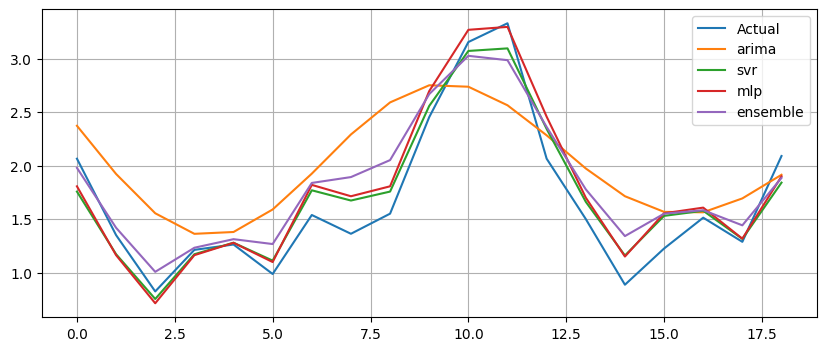

Generation 60: Fitness = 2.89393




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821026723642902
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791011098038482
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1548609901612343
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598888464813
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598888464813
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2420579906349345
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598886486242
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821026722761159
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6815900468270484
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818146154196172
SVRModel {'kernel': 'linear', 'c': 77.29671876408034, 'gamma': 'scale', 'epsilon': 0.49996750875579765} Fitness: 4.528674883827822
SVRModel {'kernel': 'linear', 'c': 77.30572661320731, 'gamma': 'scale', 'epsilon': 0.49996750875579765} Fitness: 4.530305940318099
SVRModel {'kernel': 'linear', 'c': 76.40149869800369, 'gamma': 'scale', 'epsilon': 0.4999675087557

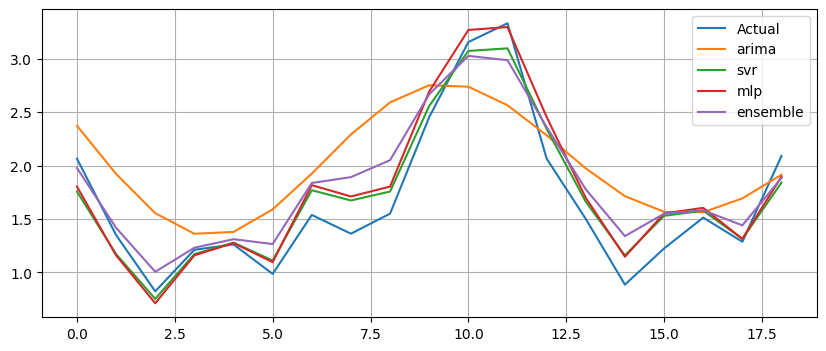

Generation 61: Fitness = 2.89944




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1549631677955454
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6814310146972022
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598888464813
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598888464813
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6819072761080196
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6817168477674191
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 2.111475174125556
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598888464813
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6817761506288718
ArimaModel {'p': 0, 'd': 0, 'q': 3} Fitness: 0.8602742115107287
SVRModel {'kernel': 'linear', 'c': 77.30572661320731, 'gamma': 'scale', 'epsilon': 0.49996750875579765} Fitness: 4.546975501833258
SVRModel {'kernel': 'linear', 'c': 77.30572661320731, 'gamma': 'scale', 'epsilon': 0.4999675087557977} Fitness: 4.529315994667229
SVRModel {'kernel': 'linear', 'c': 76.40149869800369, 'gamma': 'scale', 'epsilon': 0.499967508755797

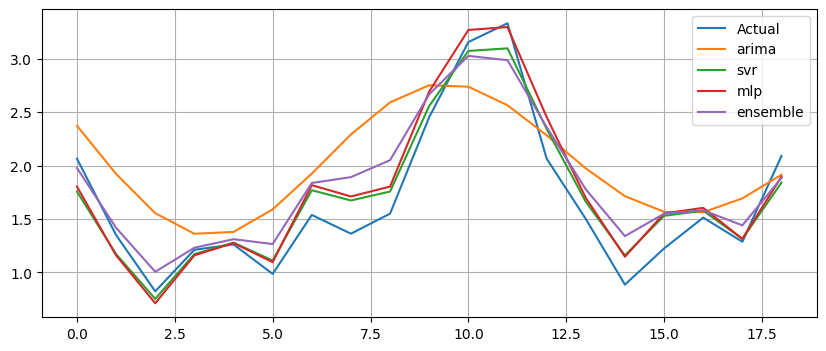

Generation 62: Fitness = 2.89944




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598888464813
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598888464813
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598888464813
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598888464813
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598888464813
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598888464813
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598888464813
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.683603700479673
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.681514538383309
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.151852178703783
SVRModel {'kernel': 'linear', 'c': 74.38064098547298, 'gamma': 'scale', 'epsilon': 0.49996750875579765} Fitness: 4.528662651169497
SVRModel {'kernel': 'linear', 'c': 76.93096178403957, 'gamma': 'scale', 'epsilon': 0.49996750875579765} Fitness: 4.528662651169497
SVRModel {'kernel': 'linear', 'c': 76.89834383579239, 'gamma': 'scale', 'epsilon': 0.4999675087557977

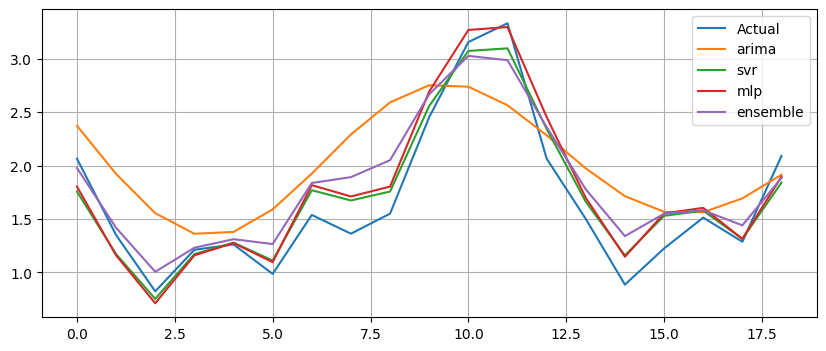

Generation 63: Fitness = 2.89944




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598888464813
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598888464813
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821252465045071
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6784398151761224
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1549631677955454
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1549631677955454
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598888464813
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6897088493066732
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598888464813
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 2.1111421083924893
SVRModel {'kernel': 'linear', 'c': 77.02471611081947, 'gamma': 'scale', 'epsilon': 0.49996750875579765} Fitness: 4.528662651169497
SVRModel {'kernel': 'linear', 'c': 76.9703197395614, 'gamma': 'scale', 'epsilon': 0.49996750875579765} Fitness: 4.528662651169497
SVRModel {'kernel': 'linear', 'c': 77.01097076992096, 'gamma': 'scale', 'epsilon': 0.42361932221503

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


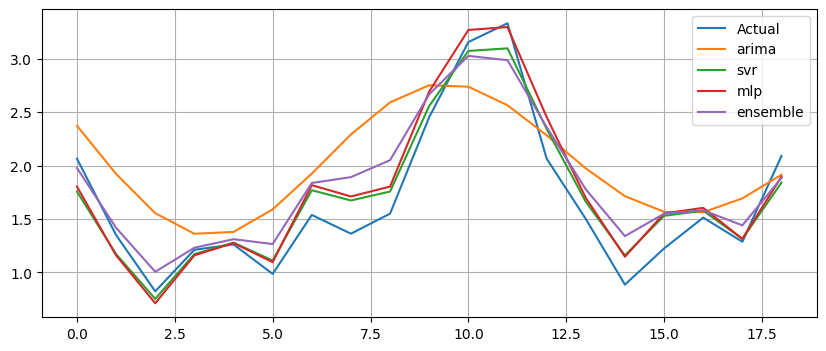

Generation 64: Fitness = 2.89944




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598888464813
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.0887793128474974
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598888464813
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 2.1114756631106255
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6779315969774902
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598888464813
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598888464813
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682279595106554
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598888464813
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598888464813
SVRModel {'kernel': 'linear', 'c': 74.42020423783666, 'gamma': 'scale', 'epsilon': 0.49996750875579765} Fitness: 4.528662651169497
SVRModel {'kernel': 'linear', 'c': 74.38064098547298, 'gamma': 'scale', 'epsilon': 0.49996750875579765} Fitness: 4.553784287055418
SVRModel {'kernel': 'linear', 'c': 74.38064098547298, 'gamma': 'scale', 'epsilon': 0.49996750875579

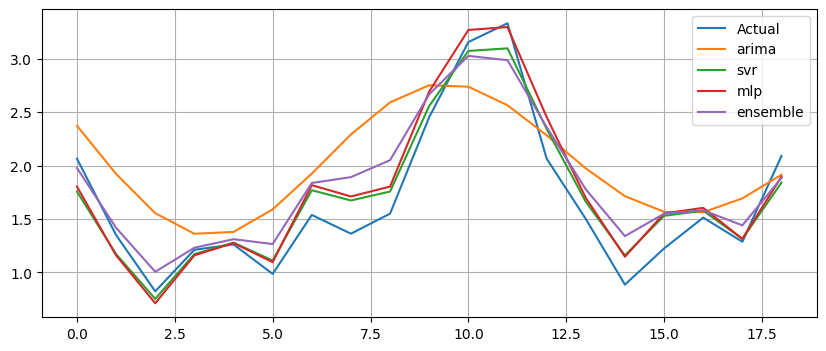

Generation 65: Fitness = 2.89944




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598888464813
ArimaModel {'p': 3, 'd': 0, 'q': 3} Fitness: 1.171362756312131
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598888464813
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598888464813
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1549631677955454
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598888464813
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6826984899960662
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.0869432640305945
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598888464813
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6815759285638006
SVRModel {'kernel': 'linear', 'c': 76.72958815755757, 'gamma': 'scale', 'epsilon': 0.4999675087557977} Fitness: 4.528662651169496
SVRModel {'kernel': 'linear', 'c': 74.5091321505067, 'gamma': 'scale', 'epsilon': 0.49996750875579765} Fitness: 4.5473579074628105
SVRModel {'kernel': 'linear', 'c': 74.42020423783666, 'gamma': 'scale', 'epsilon': 0.499967508755797

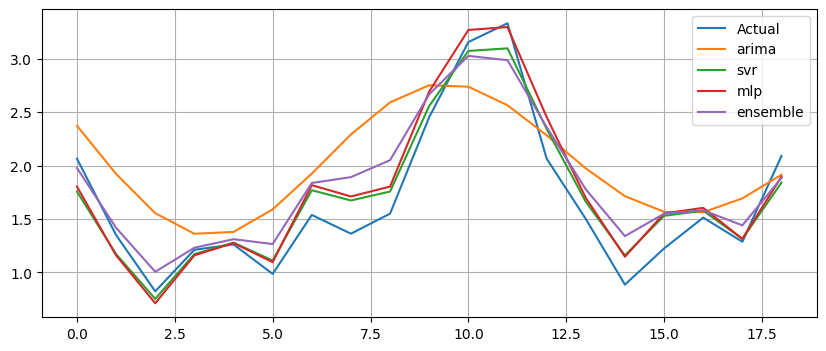

Generation 66: Fitness = 2.89944




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598888464813
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598888464813
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598888464813
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598888464813
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598888464813
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598888464813
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598888464813
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598888464813
ArimaModel {'p': 2, 'd': 0, 'q': 3} Fitness: 1.168080704024239
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 2.1114755323655814
SVRModel {'kernel': 'linear', 'c': 74.38064098547298, 'gamma': 'scale', 'epsilon': 0.49996750875579765} Fitness: 4.528662651169497
SVRModel {'kernel': 'linear', 'c': 74.38064098547298, 'gamma': 'scale', 'epsilon': 0.49996750875579765} Fitness: 4.528662651169497
SVRModel {'kernel': 'linear', 'c': 74.42020423783666, 'gamma': 'scale', 'epsilon': 0.49996750875579

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


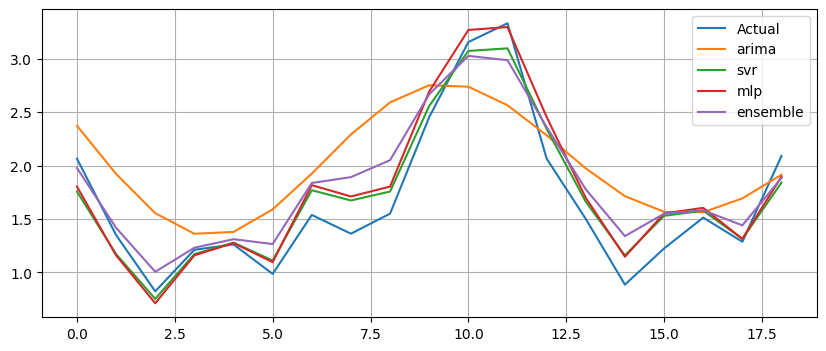

Generation 67: Fitness = 2.89944




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598888464813
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598888464813
ArimaModel {'p': 3, 'd': 0, 'q': 3} Fitness: 1.171362756312131
ArimaModel {'p': 0, 'd': 0, 'q': 3} Fitness: 0.8474749626240103
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598888464813
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1549631677955454
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598888464813
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6819977819626688
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598888464813
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598888464813
SVRModel {'kernel': 'linear', 'c': 74.39493453537834, 'gamma': 'scale', 'epsilon': 0.49996750875579765} Fitness: 4.528662651169497
SVRModel {'kernel': 'linear', 'c': 74.4059106879313, 'gamma': 'scale', 'epsilon': 0.49996750875579765} Fitness: 4.528662651169497
SVRModel {'kernel': 'linear', 'c': 79.61362161263287, 'gamma': 'scale', 'epsilon': 0.499967508755797

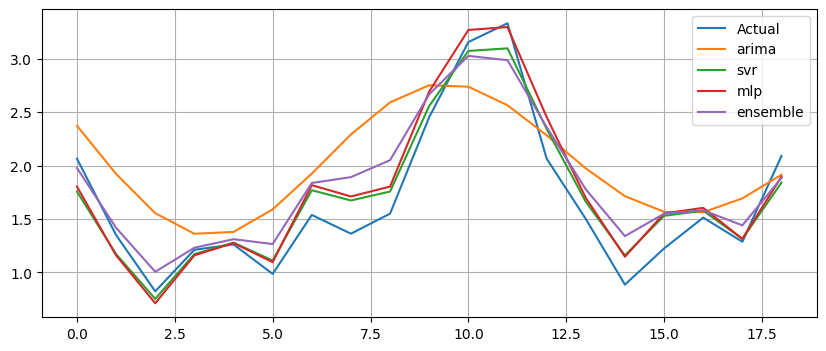

Generation 68: Fitness = 2.89944




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598888464813
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598888464813
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598888464813
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 2.1114775247288184
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598888464813
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598888464813
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598888464813
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598888464813
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598888464813
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1549631677955454
SVRModel {'kernel': 'linear', 'c': 74.38064098547298, 'gamma': 'scale', 'epsilon': 0.49996750875579765} Fitness: 4.528662651169497
SVRModel {'kernel': 'linear', 'c': 74.38064098547298, 'gamma': 'scale', 'epsilon': 0.49996750875579765} Fitness: 4.528662651169497
SVRModel {'kernel': 'linear', 'c': 74.59689714560211, 'gamma': 'scale', 'epsilon': 0.4999675087557

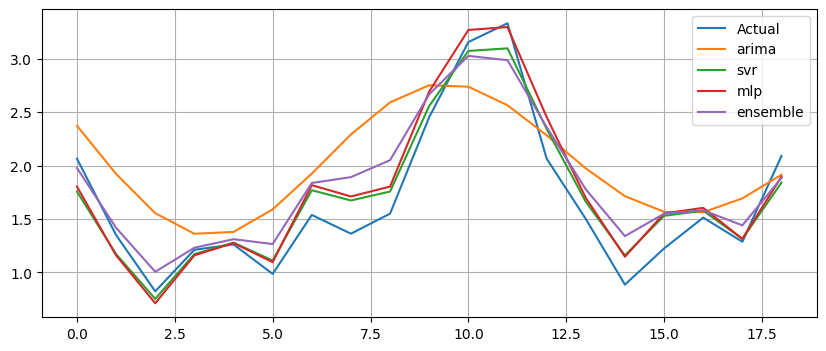

Generation 69: Fitness = 2.89944




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 2, 'd': 0, 'q': 3} Fitness: 1.168080704024239
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 2.1110967779646206
ArimaModel {'p': 4, 'd': 0, 'q': 0} Fitness: 1.083174707899589
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598888464813
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6784398151761224
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598888464813
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598888464813
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598888464813
ArimaModel {'p': 4, 'd': 0, 'q': 0} Fitness: 1.0913808845448891
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598888464813
SVRModel {'kernel': 'linear', 'c': 79.61362161263287, 'gamma': 'scale', 'epsilon': 0.49996750875579765} Fitness: 4.5475146156294555
SVRModel {'kernel': 'poly', 'c': 76.03394625617874, 'gamma': 'scale', 'epsilon': 0.49996750875579765} Fitness: 1.1140945957224255
SVRModel {'kernel': 'linear', 'c': 67.91884163517031, 'gamma': 'scale', 'epsilon': 0.499967508755797

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


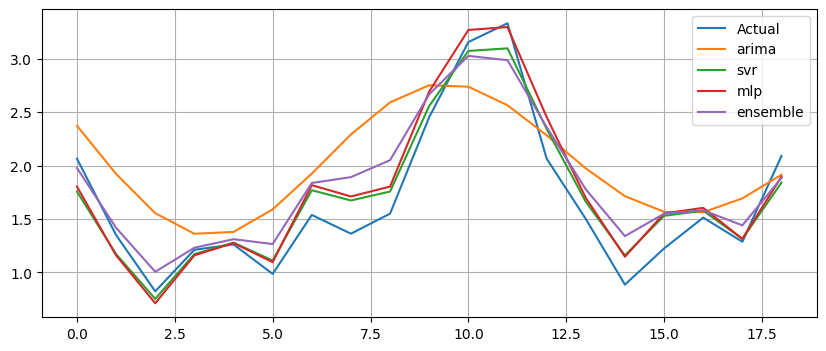

Generation 70: Fitness = 2.89944




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.68218538095822
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598888464813
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598888464813
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682159726544672
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6768459961573998
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598888464813
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.68195962786867
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598888464813
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598888464813
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6820282801968642
SVRModel {'kernel': 'linear', 'c': 76.03394625617874, 'gamma': 'scale', 'epsilon': 0.4647671861481254} Fitness: 4.45667165496533
SVRModel {'kernel': 'linear', 'c': 67.91884163517031, 'gamma': 'scale', 'epsilon': 0.49996750875579765} Fitness: 4.528662651169497
SVRModel {'kernel': 'linear', 'c': 79.61362161263287, 'gamma': 'scale', 'epsilon': 0.49996750875579765} F

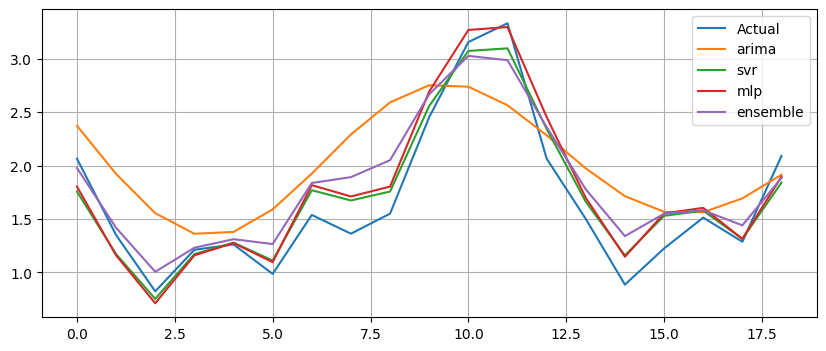

Generation 71: Fitness = 2.89944




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 2.1114685185702307
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.681843767389429
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598888464813
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598888464813
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598888464813
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598888464813
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598888464813
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598888464813
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598888464813
SVRModel {'kernel': 'poly', 'c': 67.91884163517031, 'gamma': 'scale', 'epsilon': 0.49996750875579765} Fitness: 1.131814422996493
SVRModel {'kernel': 'linear', 'c': 76.03394625617874, 'gamma': 'scale', 'epsilon': 0.49996750875579765} Fitness: 4.528827257166963
SVRModel {'kernel': 'linear', 'c': 67.91884163517031, 'gamma': 'scale', 'epsilon': 0.4999675087557976

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


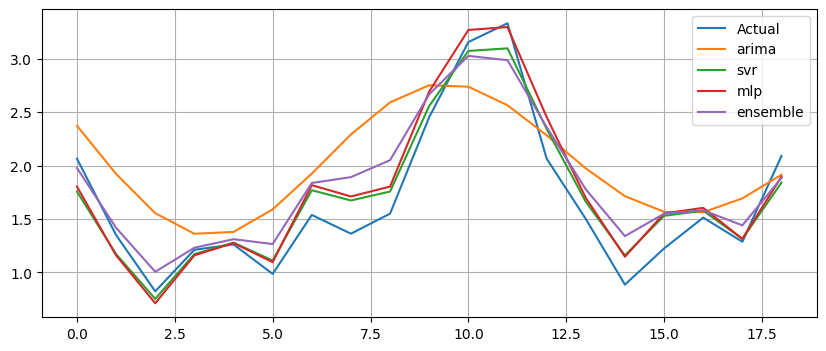

Generation 72: Fitness = 2.89944




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6903555584886036
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598888464813
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598892389196
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598929936852
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6815599070480736
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1549631677955454
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598888464813
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598888464813
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598888464813
SVRModel {'kernel': 'rbf', 'c': 75.36739223398283, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 1.4933325430746551
SVRModel {'kernel': 'linear', 'c': 76.03394625617874, 'gamma': 'scale', 'epsilon': 0.49996750875579765} Fitness: 4.528662651169497
SVRModel {'kernel': 'linear', 'c': 71.10500551517529, 'gamma': 'scale', 'epsilon': 0.49997032966488697} Fitness: 4.5

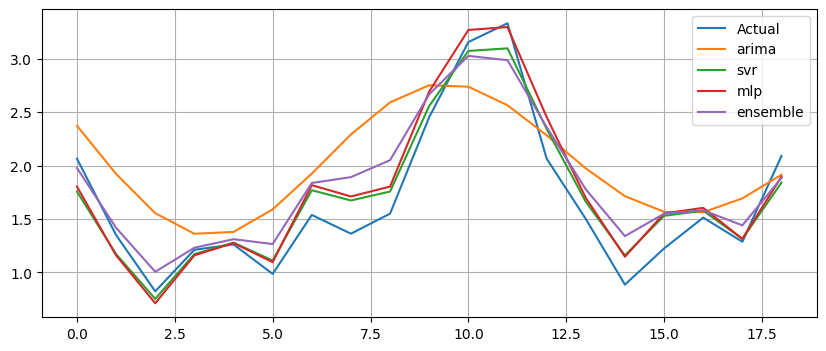

Generation 73: Fitness = 2.89944




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598892389196
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598888464813
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1549629416245757
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1549629416245757
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
SVRModel {'kernel': 'linear', 'c': 71.10500551517529, 'gamma': 'scale', 'epsilon': 0.49997032966488697} Fitness: 4.528665793015196
SVRModel {'kernel': 'linear', 'c': 75.36739223398283, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528698812486809
SVRModel {'kernel': 'linear', 'c': 67.91884163517031, 'gamma': 'scale', 'epsilon': 0.49996750875579765} Fitness: 4

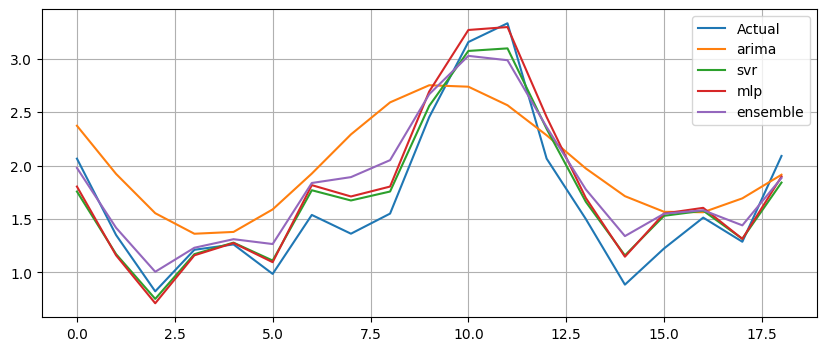

Generation 74: Fitness = 2.89945




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 0, 'd': 0, 'q': 3} Fitness: 0.8474714011198445
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6768460007011472
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 0, 'd': 0, 'q': 3} Fitness: 0.8474714011198445
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.677012555980461
SVRModel {'kernel': 'linear', 'c': 76.23580810519506, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528698812486809
SVRModel {'kernel': 'linear', 'c': 86.85453109053188, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528698812486809
SVRModel {'kernel': 'linear', 'c': 75.36739223398283, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528698812486809
SVRModel {'kerne

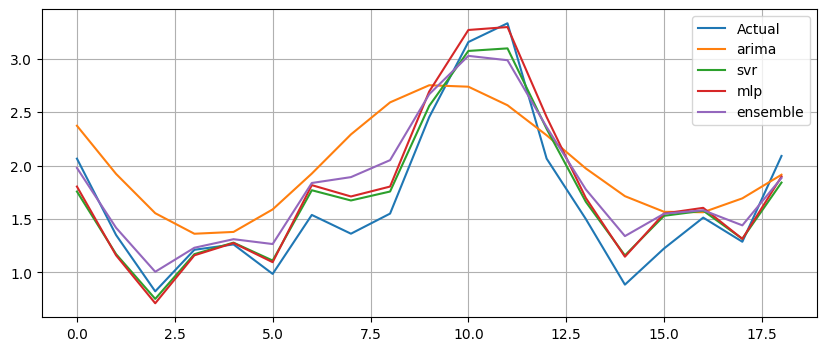

Generation 75: Fitness = 2.89945




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 1} Fitness: 1.094535891026176
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6819138393112372
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6825762038801846
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
SVRModel {'kernel': 'linear', 'c': 75.36739223398283, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528698812486809
SVRModel {'kernel': 'linear', 'c': 75.36739223398283, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5540866816717624
SVRModel {'kernel': 'linear', 'c': 73.62054016215983, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528857307912395
SVRModel {'kern

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


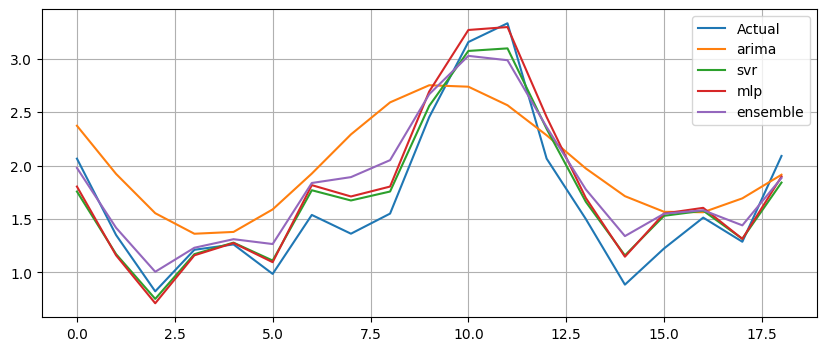

Generation 76: Fitness = 2.89945




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2420573059827722
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6816752666167465
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6819131595001091
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.679517037352012
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6788256129520471
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
SVRModel {'kernel': 'linear', 'c': 75.36739223398283, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.543461134540262
SVRModel {'kernel': 'linear', 'c': 75.27927341537085, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528698812486809
SVRModel {'kernel': 'linear', 'c': 75.29139507205369, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528698812486809
SVRModel {'kerne

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


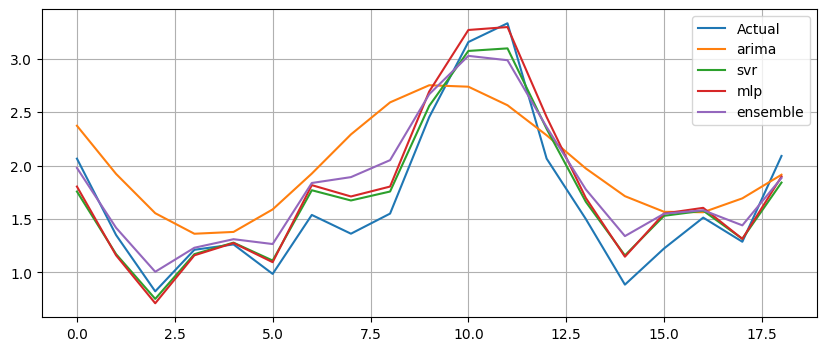

Generation 77: Fitness = 2.89945




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821605675298
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6815924911434876
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1549629416245757
ArimaModel {'p': 1, 'd': 0, 'q': 3} Fitness: 1.0754089254568338
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 2, 'd': 0, 'q': 3} Fitness: 1.1679811534266096
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
SVRModel {'kernel': 'linear', 'c': 75.36739223398283, 'gamma': 'scale', 'epsilon': 0.491156655368447} Fitness: 4.516732073976902
SVRModel {'kernel': 'linear', 'c': 81.26823722253263, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529213579137052
SVRModel {'kernel': 'linear', 'c': 75.36739223398283, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.547011432435853
SVRM

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


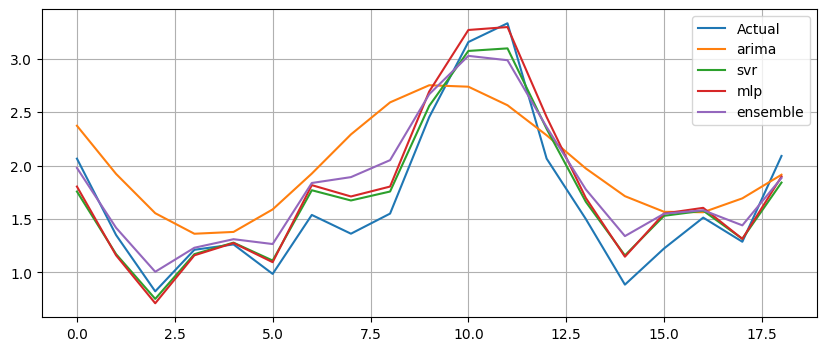

Generation 78: Fitness = 2.89945




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6825762038801846
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6814771377830104
ArimaModel {'p': 1, 'd': 0, 'q': 3} Fitness: 1.0741336572429443
SVRModel {'kernel': 'linear', 'c': 81.26823722253263, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528698812486809
SVRModel {'kernel': 'linear', 'c': 75.36739223398283, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528698812486809
SVRModel {'kernel': 'linear', 'c': 67.5898706265827, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528698812486809
SVRModel {'kerne

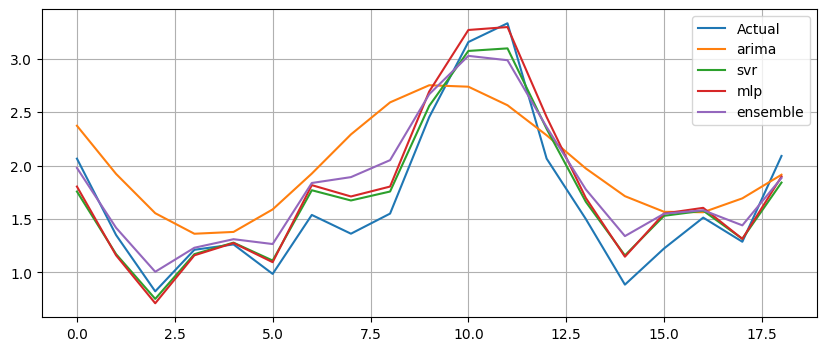

Generation 79: Fitness = 2.89945




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1538948941616525
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.7023532169116042
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6878548591223645
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6903555584886036
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 0} Fitness: 1.0911723750938256
SVRModel {'kernel': 'linear', 'c': 75.36739223398283, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.547458553193443
SVRModel {'kernel': 'linear', 'c': 75.36739223398283, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.563561217885414
SVRModel {'kernel': 'linear', 'c': 67.80215811586316, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528698812486809
SVRModel {'kern

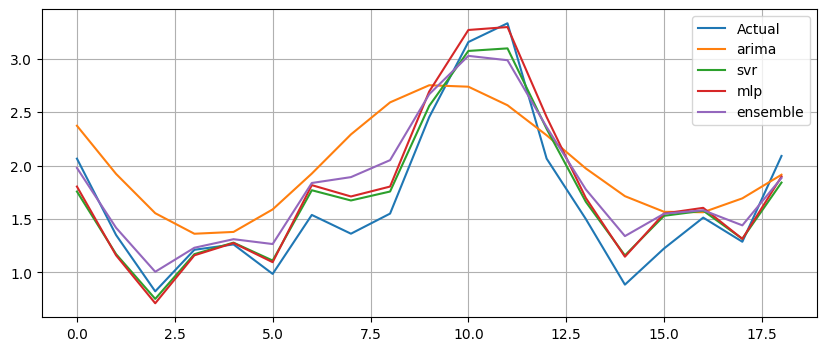

Generation 80: Fitness = 2.89945




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6878548591223645
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
SVRModel {'kernel': 'linear', 'c': 75.36739223398283, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528698812486809
SVRModel {'kernel': 'linear', 'c': 73.14782551905928, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.540268543332013
SVRModel {'kernel': 'linear', 'c': 75.36739223398283, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528698812486809
SVRModel {'kern

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


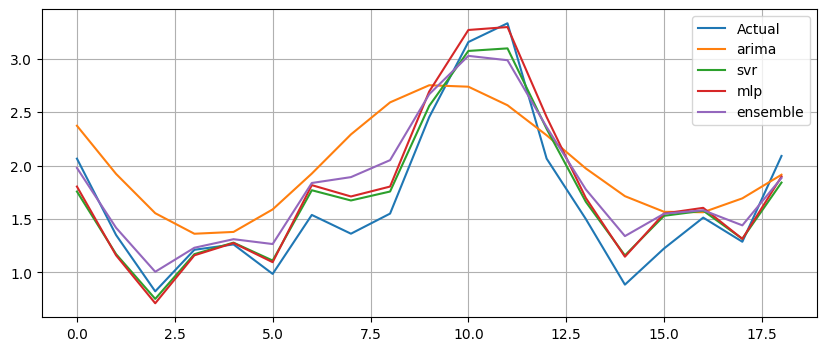

Generation 81: Fitness = 2.89945




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 0, 'q': 3} Fitness: 1.197307306847873
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6768460007011472
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6814980174323177
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 2.1114438378657154
SVRModel {'kernel': 'linear', 'c': 73.14782551905928, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.582255863365012
SVRModel {'kernel': 'linear', 'c': 73.14782551905928, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528698812486809
SVRModel {'kernel': 'linear', 'c': 72.16772540652288, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528698812486809
SVRModel {'kerne

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


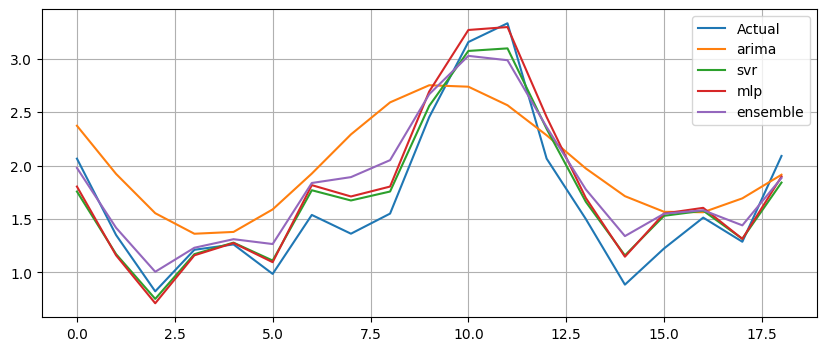

Generation 82: Fitness = 2.89945




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1442808265877678
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
SVRModel {'kernel': 'linear', 'c': 73.53236229091098, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528698812486809
SVRModel {'kernel': 'linear', 'c': 72.16772540652288, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.555855606820022
SVRModel {'kernel': 'linear', 'c': 78.14729337576952, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528698812486809
SVRModel {'kern

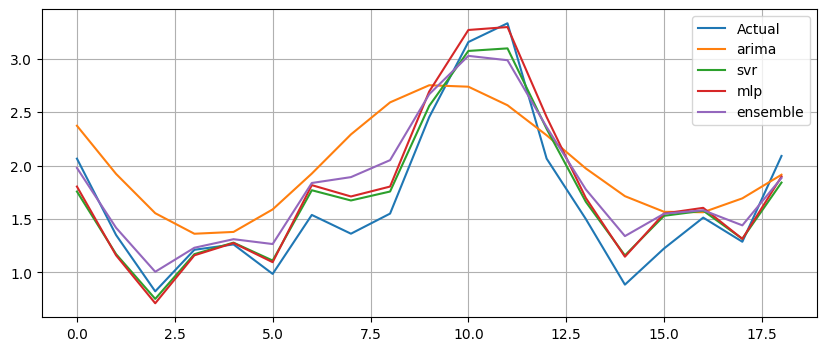

Generation 83: Fitness = 2.89945




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682161631177322
ArimaModel {'p': 1, 'd': 0, 'q': 3} Fitness: 1.0741336572429443
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6812028781749229
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
SVRModel {'kernel': 'linear', 'c': 72.16772540652288, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528698812486809
SVRModel {'kernel': 'linear', 'c': 72.16772540652288, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528698812486809
SVRModel {'kernel': 'linear', 'c': 73.80297460094022, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528698812486809
SVRModel {'kerne

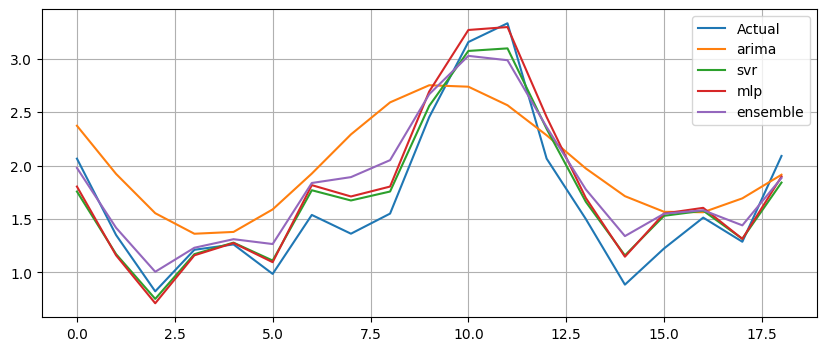

Generation 84: Fitness = 2.89945




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 2, 'd': 0, 'q': 3} Fitness: 1.1680801098413813
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6852748995483324
ArimaModel {'p': 2, 'd': 0, 'q': 3} Fitness: 1.1682974903548298
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.681781785608416
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
SVRModel {'kernel': 'linear', 'c': 75.15890240247069, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5475501782201615
SVRModel {'kernel': 'linear', 'c': 79.47990995238594, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528698812486809
SVRModel {'kernel': 'linear', 'c': 75.78744154843135, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.537363461858644
SVRModel {'kern

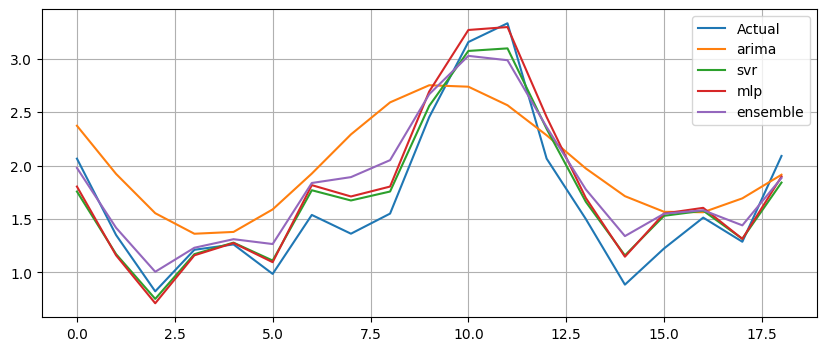

Generation 85: Fitness = 2.89945




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 1} Fitness: 1.094535891026176
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6817996995016107
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1549629416245757
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 0, 'd': 0, 'q': 3} Fitness: 0.8474714011198445
SVRModel {'kernel': 'linear', 'c': 75.15890240247069, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528698812486809
SVRModel {'kernel': 'linear', 'c': 75.15890240247069, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5540866816717624
SVRModel {'kernel': 'linear', 'c': 75.78744154843135, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528698812486809
SVRModel {'kern

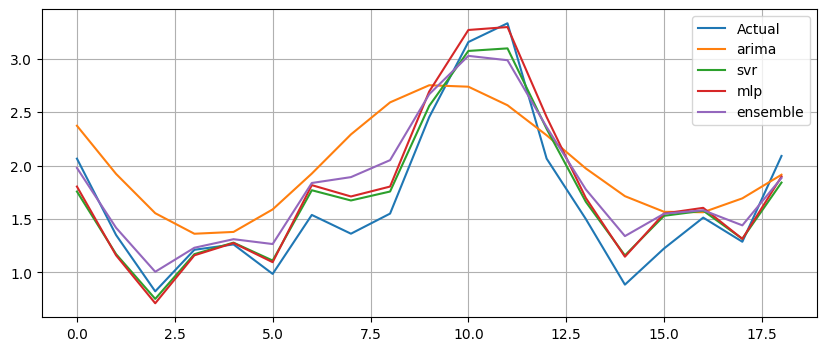

Generation 86: Fitness = 2.89945




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.7023532169116042
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.694836420414569
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.650986969437217
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1549629416245757
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.677665172658421
SVRModel {'kernel': 'linear', 'c': 75.3829306364002, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.563561217885414
SVRModel {'kernel': 'rbf', 'c': 75.15890240247069, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 1.5226747224986372
SVRModel {'kernel': 'linear', 'c': 75.3829306364002, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528698812486809
SVRModel {'kernel': 'p

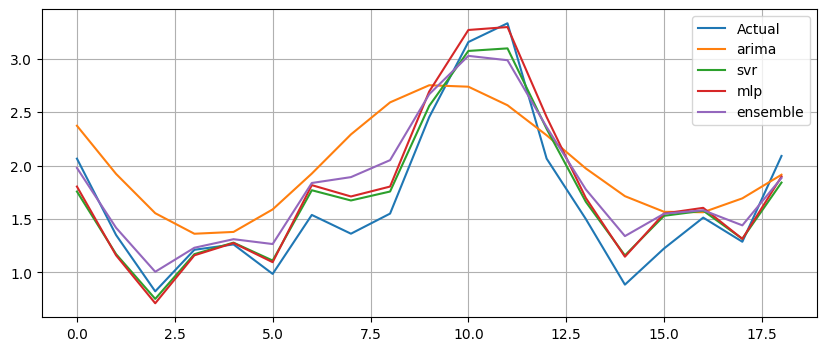

Generation 87: Fitness = 2.89945




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.681338659213307
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
SVRModel {'kernel': 'linear', 'c': 75.3829306364002, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528698812486809
SVRModel {'kernel': 'linear', 'c': 75.3829306364002, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528698812486809
SVRModel {'kernel': 'linear', 'c': 73.96483876339323, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528698812486809
SVRModel {'kernel'

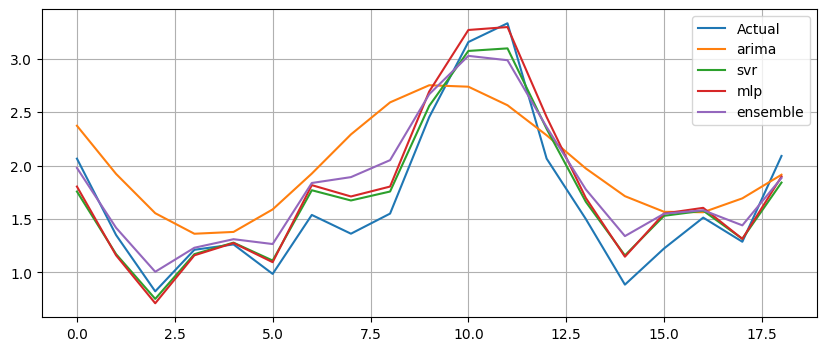

Generation 88: Fitness = 2.89945




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.679517037352012
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 2.1114427374437588
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
SVRModel {'kernel': 'linear', 'c': 75.3829306364002, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.532316357362801
SVRModel {'kernel': 'linear', 'c': 74.97744854368366, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528698812486809
SVRModel {'kernel': 'linear', 'c': 75.3829306364002, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528698812486809
SVRModel {'kernel'

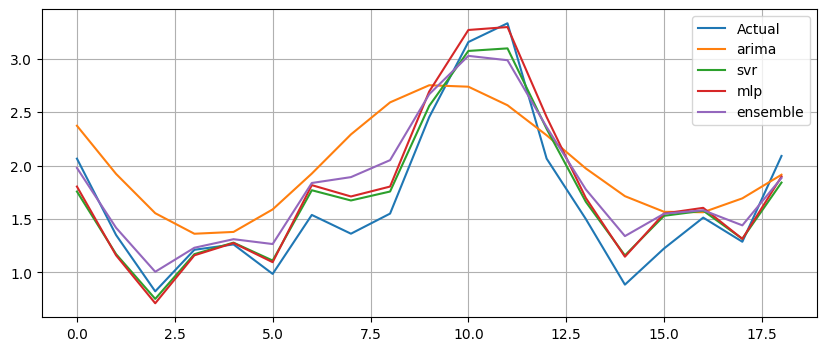

Generation 89: Fitness = 2.89945




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6854439186132066
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6812379714982417
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6852748995483324
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
SVRModel {'kernel': 'linear', 'c': 75.1702775689856, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.540368873905342
SVRModel {'kernel': 'linear', 'c': 75.19010161109827, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.532164703183232
SVRModel {'kernel': 'linear', 'c': 75.3829306364002, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528698812486809
SVRModel {'kernel

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


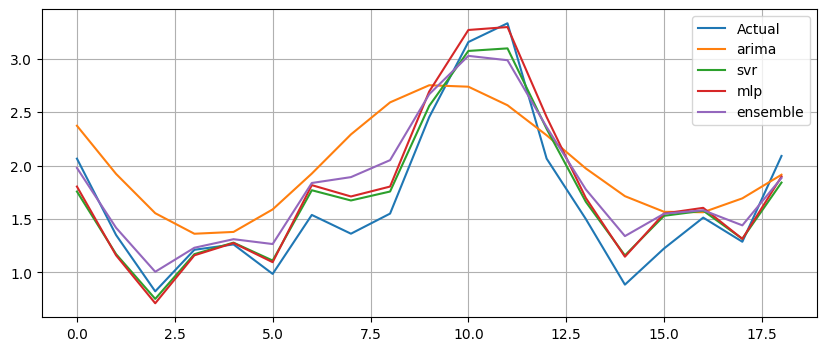

Generation 90: Fitness = 2.89945




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791011143475956
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
SVRModel {'kernel': 'linear', 'c': 75.1702775689856, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528698812486809
SVRModel {'kernel': 'linear', 'c': 75.19010161109827, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528698812486809
SVRModel {'kernel': 'linear', 'c': 75.1702775689856, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.530342294270563
SVRModel {'kernel

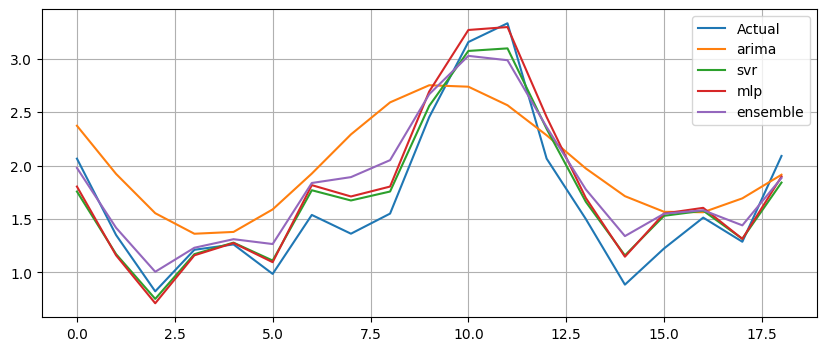

Generation 91: Fitness = 2.89945




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6779316015212375
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 0} Fitness: 1.091380239074155
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.681781785608416
SVRModel {'kernel': 'linear', 'c': 75.18148135972022, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528698812486809
SVRModel {'kernel': 'linear', 'c': 75.17889782036364, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528698812486809
SVRModel {'kernel': 'linear', 'c': 75.1702775689856, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528698812486809
SVRModel {'kernel'

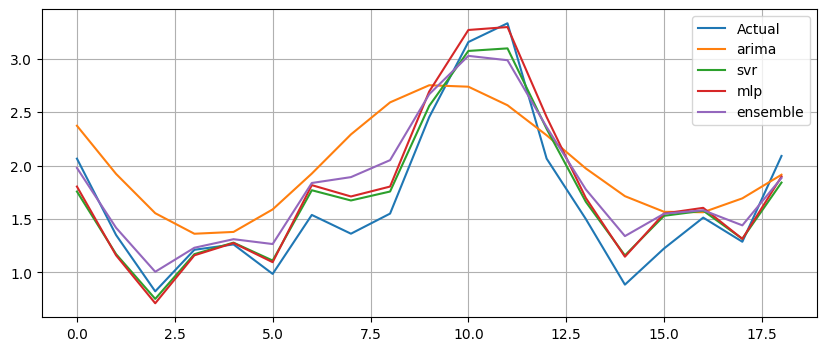

Generation 92: Fitness = 2.89945




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 2, 'd': 0, 'q': 3} Fitness: 1.1701758586406532
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821691846140931
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6817406697707284
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
SVRModel {'kernel': 'linear', 'c': 75.19668800031377, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528698812486809
SVRModel {'kernel': 'linear', 'c': 75.1719541125741, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528698812486809
SVRModel {'kernel': 'linear', 'c': 75.1719541125741, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528698812486809
SVRModel {'kernel

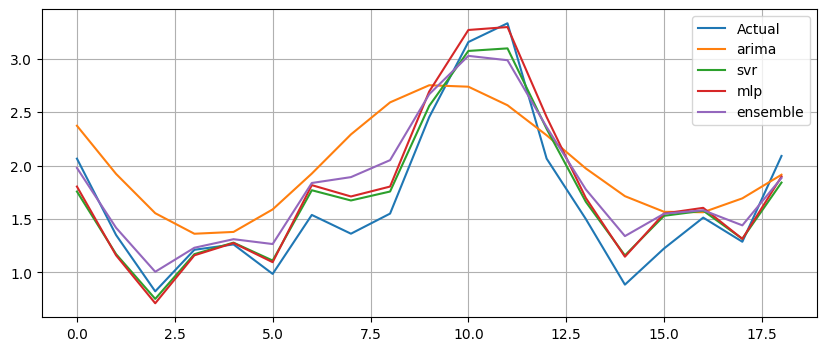

Generation 93: Fitness = 2.89945




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 1, 'd': 0, 'q': 3} Fitness: 1.0740704539594903
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6815572664235594
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
SVRModel {'kernel': 'linear', 'c': 75.21228893659975, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528698812486809
SVRModel {'kernel': 'linear', 'c': 75.2104510916455, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528698812486809
SVRModel {'kernel': 'linear', 'c': 75.22531534438225, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528698812486809
SVRModel {'kerne

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


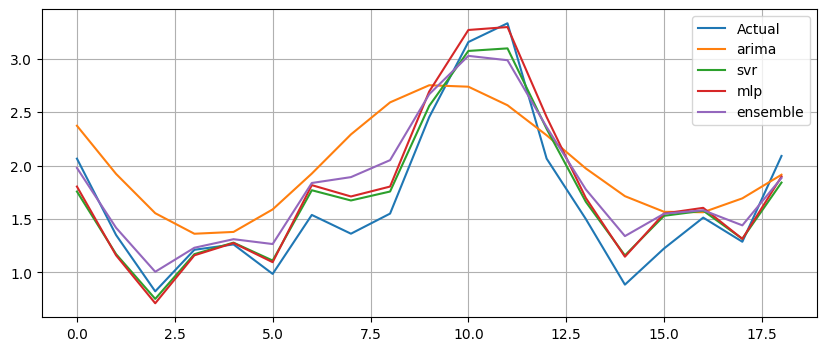

Generation 94: Fitness = 2.89945




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6768460007011472
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598423108377
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
SVRModel {'kernel': 'linear', 'c': 75.19010161109827, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528698812486809
SVRModel {'kernel': 'linear', 'c': 75.23263841714697, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528698812486809
SVRModel {'kernel': 'linear', 'c': 75.27133969882179, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528698812486809
SVRModel {'kern

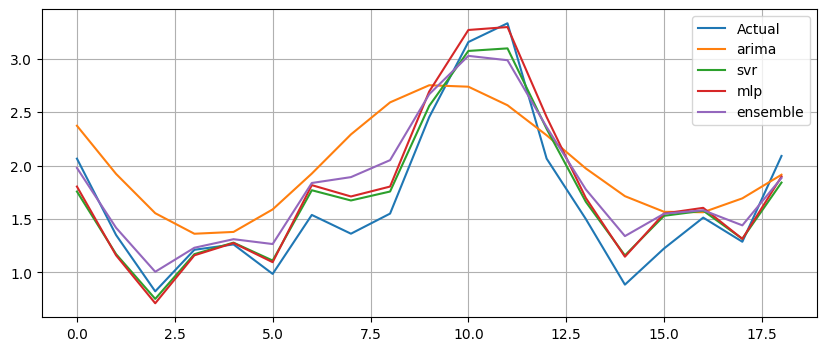

Generation 95: Fitness = 2.89945




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 2, 'd': 0, 'q': 3} Fitness: 1.1680801098413813
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6854439186132066
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818146239387437
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6819633504940013
SVRModel {'kernel': 'linear', 'c': 75.23942383940572, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528698812486809
SVRModel {'kernel': 'linear', 'c': 75.23942383940572, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528698812486809
SVRModel {'kernel': 'linear', 'c': 75.20610627111577, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528698812486809
SVRModel {'kern

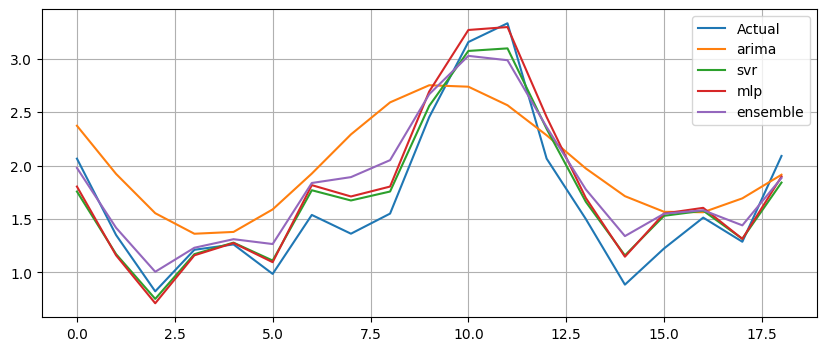

Generation 96: Fitness = 2.89945




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 1} Fitness: 1.095544857696731
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6820118025765365
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.681645910784785
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6767596420721593
SVRModel {'kernel': 'linear', 'c': 75.20526369680536, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528698812486809
SVRModel {'kernel': 'linear', 'c': 75.19712685089266, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528698812486809
SVRModel {'kernel': 'linear', 'c': 75.23942383940572, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528698812486809
SVRModel {'kernel

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


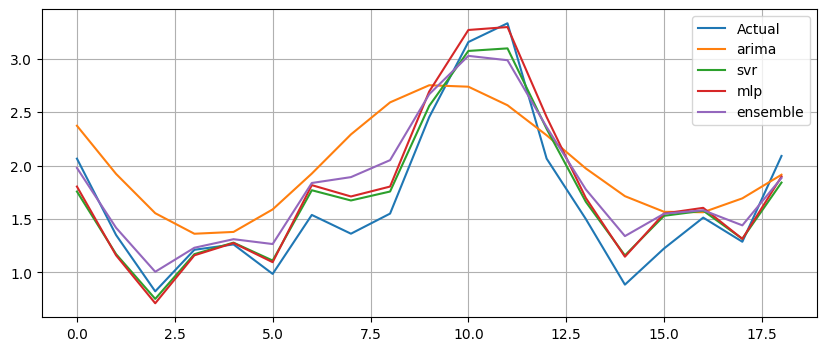

Generation 97: Fitness = 2.89945




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 1, 'd': 0, 'q': 3} Fitness: 1.0738464384231328
ArimaModel {'p': 0, 'd': 0, 'q': 3} Fitness: 0.8474714011198445
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6817346432333442
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
SVRModel {'kernel': 'linear', 'c': 76.82248676285545, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528698812486809
SVRModel {'kernel': 'linear', 'c': 75.19712685089266, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.556107819310042
SVRModel {'kernel': 'linear', 'c': 75.20898968053427, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.674583147675012
SVRModel {'kern

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


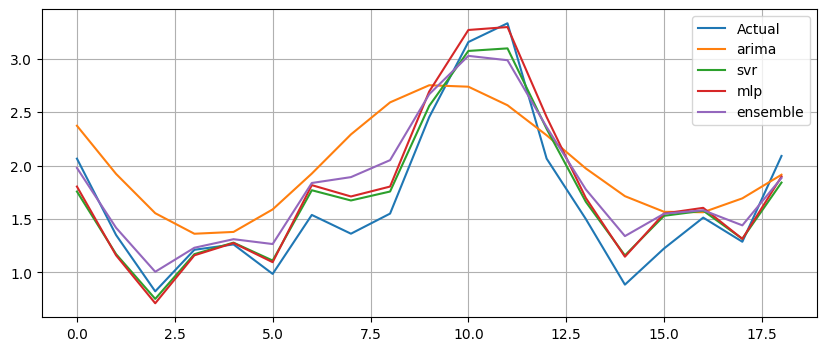

Generation 98: Fitness = 2.89945




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682447022233059
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 3, 'd': 0, 'q': 3} Fitness: 1.171362150042163
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
SVRModel {'kernel': 'linear', 'c': 76.82248676285545, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.535034528413606
SVRModel {'kernel': 'linear', 'c': 75.20898968053427, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528698812486809
SVRModel {'kernel': 'linear', 'c': 75.20898968053427, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528698812486809
SVRModel {'kernel

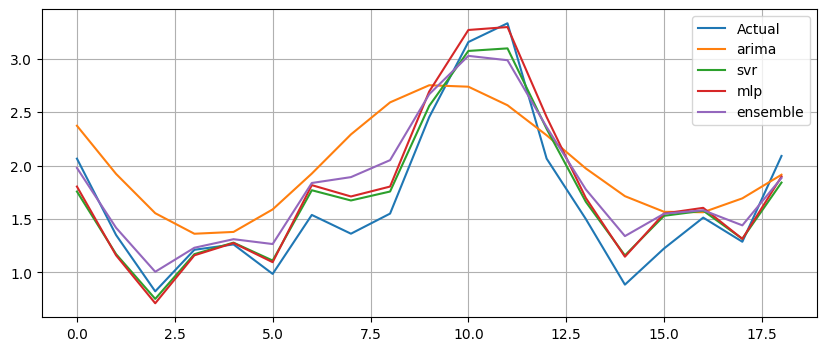

Generation 99: Fitness = 2.89945




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 0} Fitness: 1.1169194701962635
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818692483377198
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.0887788549678903
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 0, 'd': 0, 'q': 3} Fitness: 0.8474714011198445
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821598933902286
SVRModel {'kernel': 'linear', 'c': 75.20898968053427, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.588721054181275
SVRModel {'kernel': 'linear', 'c': 75.2104510916455, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528698812486809
SVRModel {'kernel': 'linear', 'c': 75.20898968053427, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5289393498299155
SVRModel {'kern

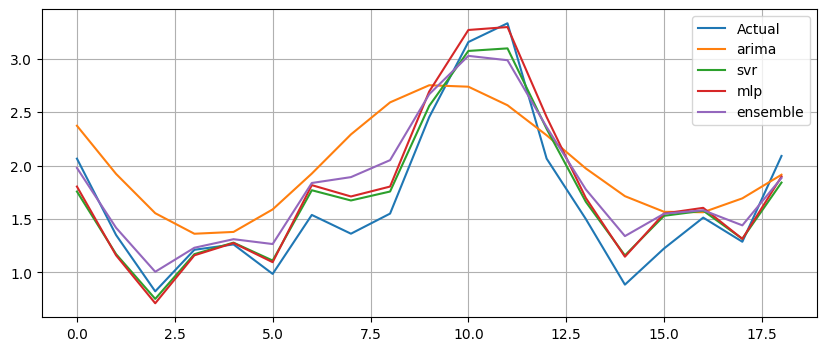

Generation 100: Fitness = 2.89945




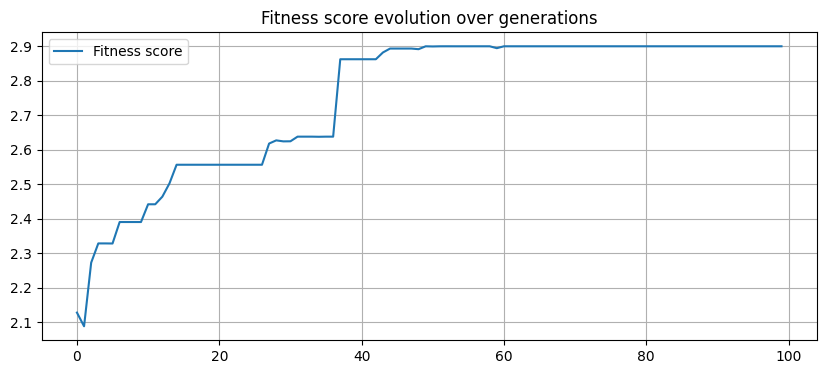

In [18]:
pool_of_models = [ArimaModel, SVRModel, MLPModel]
population_size = 10
num_generations = 100
mutation_rate = 0.2

print('Initializing population...')
population = init_population(population_size, pool_of_models)

print('Population created: ')
print_population(population)

fitness_score_collection = []

for generation in range(num_generations):

    # individual_evaluation(population, data)
    individual_evaluation_with_diversity(population, X_train_scaled, y_train_scaled, X_val_scaled, y_val_scaled)
    print_population(population)

    fitness_score, _, _, _ = team_evaluation(population, X_val_scaled, y_val_scaled)
    fitness_score_collection.append(fitness_score)

    print(f"Generation {generation + 1}: Fitness = {fitness_score:.5f}")
    print('=============================\n\n')

    # Selection by tournament
    selected_pop = tournament_selection(population)
    # print('selected population:')
    # print_population(selected_pop)

    # Crossover
    crossed_pop = crossover(selected_pop)
    # print('Crossed population:')
    # print_population(crossed_pop)
    
    # Mutation
    population = mutation(crossed_pop)
    # print_population(population)

plt.figure(figsize=(10, 4))
plt.plot(fitness_score_collection, label='Fitness score')
plt.title('Fitness score evolution over generations')
plt.grid()
plt.legend()
plt.show()

# Test

In [19]:
print('Best models:')
best_models = {}
# Select the best individual of each subpopulation
for model in population.keys():
    best_ind = None
    for individual in population[model]:
        best_ind = individual if best_ind is None or individual.fitness_score > best_ind.fitness_score else best_ind
    
    best_models[best_ind.get_name()] = best_ind

best_models

Best models:


{'arima': ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 0.0,
 'svr': SVRModel {'kernel': 'linear', 'c': 76.00100229397248, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 0.0,
 'mlp': MLPModel {'hidden_layer_sizes': 20, 'learning_rate': 0.021782123291985204} Fitness: 0.0}

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


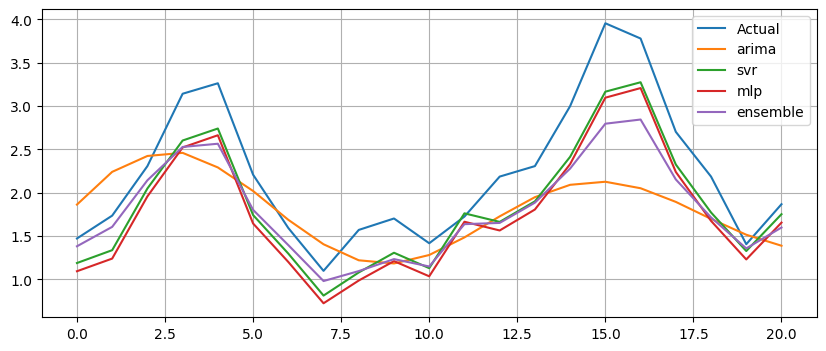

RMSE: 80.79858338180311
MSE: 6528.4110765061905


In [23]:
from sklearn.preprocessing import MinMaxScaler

X_train_val = pd.concat([X_train.copy(), X_val.copy()])
y_train_val = pd.concat([y_train.copy(), y_val.copy()])



X_train_scaler = StandardScaler()
y_train_scaler = StandardScaler()

X_train_scaled = X_train_scaler.fit_transform(np.array(X_train_val).reshape(-1,1))
X_test_scaled = X_train_scaler.transform(np.array(X_test).reshape(-1,1))

y_train_scaled = y_train_scaler.fit_transform(np.array(y_train_val).reshape(-1,1)).ravel()
y_test_scaled = y_train_scaler.transform(np.array(y_test).reshape(-1,1)).ravel()

# X_train_scaled = np.array(X_train_val).reshape(-1,1)
# X_test_scaled = np.array(data['X_test']).reshape(-1,1)
# y_train_scaled = np.array(y_train).reshape(-1, 1).ravel()
# y_test_scaled = np.array(data['y_test']).reshape(-1, 1).ravel()


models = {
    'arima': ArimaModel(ARIMA, {'p': 4, 'd': 0, 'q': 3}),
    'svr': SVRModel(SVR, {'kernel': 'linear', 'c': 76.00100229397248, 'gamma': 'scale', 'epsilon': 0.5}),
    'mlp': MLPModel(MLPRegressor, {'hidden_layer_sizes': 20, 'learning_rate': 0.021782123291985204})
}

for model_name in models.keys():
    models[model_name].train(X_train_scaled, y_train_scaled)

ensemble = EnsembleModel(None, models)
pred = ensemble.predict(X_test_scaled)


models['ensemble'] = ensemble
plot_forecasts(models.values(), y_test_scaled)

pred_transf = X_train_scaler.inverse_transform(pred.reshape(-1,1))

mse = mean_squared_error(pred_transf, y_test)
rmse = np.sqrt(mean_squared_error(pred_transf, y_test))

print('RMSE: {}'.format(rmse))
print('MSE: {}'.format(mse))
